# (Ax = b) | xi > 0

In [2]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt
import os, pickle, random
from sklearn.cluster import KMeans
from scipy.sparse import rand
import scipy
from scipy.optimize import lsq_linear
import matplotlib.pyplot as plt

### Pulling data subset and cleaning

In [3]:
data = pickle.load(open( "data2007.pickle", "rb" ))[-500:]
data = data # subset
data = data.clip(upper=.05) # bounding single day gain
data = data.clip(lower=-.05) # bounding single day loss
data = data.replace([np.inf, -np.inf], np.nan) # removing any inf value
data = data.dropna(axis='columns') # dropping any columns with nan

for x in list(data): # removing columns without starting data
    if data.iloc[0][x] == 0 and data.iloc[1][x] == 0  and data.iloc[1][x] == 0:
        data = data.drop(x,axis=1)

In [4]:
'''# taking 30 moving averages (probably inefficient method)
# emphesizes large ups/downs

roll = pd.DataFrame(columns=list(data))
for i in range(6,len(data)-6):
    roll.loc[i] = [np.nanmean([(1+y)**1 for y in list(data[x][i-0:i+1])]) for x in (list(data))]
roll.head()'''

'# taking 30 moving averages (probably inefficient method)\n# emphesizes large ups/downs\n\nroll = pd.DataFrame(columns=list(data))\nfor i in range(6,len(data)-6):\n    roll.loc[i] = [np.nanmean([(1+y)**1 for y in list(data[x][i-0:i+1])]) for x in (list(data))]\nroll.head()'

In [5]:
roll = data + 1

### Useful functions!

In [6]:
# Ensures all stock have the same variance (while maintaning form)

def fixvar(vals):
    Dval = 0.000001*len(vals)
    var = np.nanvar(vals)
    ratio = (Dval/var)**.5
    mean = np.nanmean(vals)
    transformed = [(x-mean)*ratio + mean for x in vals]
    return(transformed)

### Let the transformation begin...

In [ ]:
tickers = list(roll)

# applying fixvar to all stocks
rollvar = pd.DataFrame()
for x in tickers:
    rollvar[x] = fixvar(list(roll[x]))

plt.figure(figsize=(12,8))
plt.plot(list(rollvar['AAPL']),color='blue',linestyle=':')
plt.plot(list(roll['AAPL']),color='blue')
plt.plot(list(rollvar['GLD']),color='green',linestyle= ':')
plt.plot(list(roll['GLD']),color='green')

In [ ]:
A = np.array(rollvar)
A[np.isnan(A)]=1
b = np.array([len(A[0]) for i in range(len(rollvar))])

vals = np.array(scipy.optimize.nnls(A, b)[0])
v = [x/len(list(roll)) for x in np.dot(A,vals)]

In [ ]:
weights = pd.DataFrame()
weights['Stock'] = list(rollvar)
weights['Weight'] = vals
weights = weights.sort_values(by='Weight',ascending=False)

weights = weights[weights['Weight'] > 0]
weights.head(len(weights))

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(v,linewidth=5, linestyle="-",c='black')
k = 0
for s in np.array(list(weights['Stock'])):
    #print(vals[list(roll).index(s)])
    plt.plot(list(rollvar[s]),linewidth=vals[list(rollvar).index(s)]/20,linestyle='-',alpha=.25,c='blue')
    k += 1
plt.show()

plt.figure(figsize=(12,8))
plt.plot(list(rollvar['SPY']),color='blue',label='SPY')
plt.plot(list(v),color='black',linewidth=5,label='Portfolio')
plt.legend()
plt.show()

In [ ]:
test = pickle.load(open( "data2007_real.pickle", "rb" ))[-500:]
test = test.replace(0, np.nan)
test = test.replace([np.inf, -np.inf], np.nan)
test = test.dropna(axis='columns')
dfm = test.apply(lambda x: x/list(x)[0], axis=0)
dfm.head()

In [ ]:
portfolio = pd.DataFrame()
for i in range(len(weights)):
    try:
        portfolio[weights.iloc[i]['Stock']] = [weights.iloc[i]['Weight']*x for x in dfm[weights.iloc[i]['Stock']]]
    except:
        pass
portfolio = portfolio.dropna(axis=0)

In [ ]:
portfolio.head()

In [ ]:
dfm = dfm.clip(upper=5)
dfm = dfm.clip(lower=.2)
evaluation = portfolio.sum(axis=1)
evaluation = [x/evaluation[0] for x in evaluation]

plt.figure(figsize=(15,10))
plt.plot(evaluation,linewidth=5,color='black')
plt.plot(list(dfm.mean(axis=1)),color='blue',linewidth=1)
plt.plot(list(dfm['SPY']),color='g')

In [ ]:
for i in range(300):
    end = i*20+250
    show = end+1
    
    data = pickle.load(open( "data2007.pickle", "rb" ))[max(0,end-250):end]
    print(data.index[0],data.index[-1])
    data = data # subset
    data = data.clip(upper=.05) # bounding single day gain
    data = data.clip(lower=-.05) # bounding single day loss
    data = data.replace([np.inf, -np.inf], np.nan) # removing any inf value
    data = data.dropna(axis='columns') # dropping any columns with nan

    ######

    for x in list(data): # removing columns without starting data
        if data.iloc[0][x] == 0 and data.iloc[1][x] == 0  and data.iloc[1][x] == 0:
            data = data.drop(x,axis=1)

    ########        

    roll = data + 1

    ########

    tickers = list(roll)

    # applying fixvar to all stocks
    rollvar = pd.DataFrame()
    for x in tickers:
        rollvar[x] = fixvar(list(roll[x]))

    ########

    A = np.array(rollvar)
    A[np.isnan(A)]=1
    b = np.array([len(A[0]) for i in range(len(rollvar))])

    vals = np.array(scipy.optimize.nnls(A, b)[0])
    v = [x/len(list(roll)) for x in np.dot(A,vals)]

    ########

    weights = pd.DataFrame()
    weights['Stock'] = list(rollvar)
    weights['Weight'] = vals
    weights = weights.sort_values(by='Weight',ascending=False)

    weights = weights[weights['Weight'] > 0]
    
    ########

    test = pickle.load(open( "data2007_real.pickle", "rb" ))[show:show+30]
    print(test.index[0],test.index[-1])
    test = test.replace(0, np.nan)
    test = test.replace([np.inf, -np.inf], np.nan)
    test = test.dropna(axis='columns')
    dfm = test.apply(lambda x: x/list(x)[0], axis=0)

    ########

    portfolio = pd.DataFrame()
    for i in range(len(weights)):
        try:
            portfolio[weights.iloc[i]['Stock']] = [weights.iloc[i]['Weight']*x for x in dfm[weights.iloc[i]['Stock']]]
        except:
            pass
    portfolio = portfolio.dropna(axis=0)

    dfm = dfm.clip(upper=5)
    dfm = dfm.clip(lower=.2)
    evaluation = portfolio.sum(axis=1)
    evaluation = [x/evaluation[0] for x in evaluation]

    plt.figure(figsize=(15,3))
    plt.plot(evaluation,linewidth=5,color='black')
    plt.plot(list(dfm.mean(axis=1)),color='blue',linewidth=1)
    plt.plot(list(dfm['SPY']),color='g')
    print(list(weights['Stock'][:10]))
    plt.show()
    

In [ ]:
total = [1]
for i in range(300):
    end = (i+1)*30+250
    show = end+1
    
    data = pickle.load(open( "data2007.pickle", "rb" ))[max(0,end-250):end]
    print(data.index[0],data.index[-1])
    data = data # subset
    data = data.clip(upper=.05) # bounding single day gain
    data = data.clip(lower=-.05) # bounding single day loss
    data = data.replace([np.inf, -np.inf], np.nan) # removing any inf value
    data = data.dropna(axis='columns') # dropping any columns with nan

    ######

    for x in list(data): # removing columns without starting data
        if data.iloc[0][x] == 0 and data.iloc[1][x] == 0  and data.iloc[1][x] == 0:
            data = data.drop(x,axis=1)

    ########        

    roll = data + 1

    ########

    tickers = list(roll)

    # applying fixvar to all stocks
    rollvar = pd.DataFrame()
    for x in tickers:
        rollvar[x] = fixvar(list(roll[x]))

    ########

    A = np.array(rollvar)
    A[np.isnan(A)]=1
    b = np.array([len(A[0]) for i in range(len(rollvar))])

    vals = np.array(scipy.optimize.nnls(A, b)[0])
    v = [x/len(list(roll)) for x in np.dot(A,vals)]

    ########

    weights = pd.DataFrame()
    weights['Stock'] = list(rollvar)
    weights['Weight'] = vals
    weights = weights.sort_values(by='Weight',ascending=False)

    weights = weights[weights['Weight'] > 0]
    
    ########

    test = pickle.load(open( "data2007_real.pickle", "rb" ))[show:show+30]
    print(test.index[0],test.index[-1])
    test = test.replace(0, np.nan)
    test = test.replace([np.inf, -np.inf], np.nan)
    test = test.dropna(axis='columns')
    dfm = test.apply(lambda x: x/list(x)[0], axis=0)

    ########

    portfolio = pd.DataFrame()
    for i in range(len(weights)):
        try:
            portfolio[weights.iloc[i]['Stock']] = [weights.iloc[i]['Weight']*x for x in dfm[weights.iloc[i]['Stock']]]
        except:
            pass
    portfolio = portfolio.dropna(axis=0)

    dfm = dfm.clip(upper=5)
    dfm = dfm.clip(lower=.2)
    evaluation = portfolio.sum(axis=1)
    evaluation = [x*total[-1]/evaluation[0] for x in evaluation]
    total.append(evaluation[-1])

In [ ]:
cumulative = [total[0]]
for i in range(1,len(total)*30):
    if i%30 == 1:
        cumulative.append(cumulative[-1]*total[i//30])
    else:
        cumulative.append(cumulative[-1])

In [ ]:
test = pickle.load(open( "data2007_real.pickle", "rb" ))


In [ ]:
plt.plot(cumulative)
SPY = list(pickle.load(open( "data2007_real.pickle", "rb" ))['SPY'])

test = pickle.load(open( "data2007_real.pickle", "rb" ))
test = test.replace(0, np.nan)
test = test.replace([np.inf, -np.inf], np.nan)
test = test.dropna(axis='columns')
dfm = test.apply(lambda x: x/list(x)[0], axis=0)

newdfm = dfm[['AAPL','MSFT','XOM','GE','WMT']]
nsum = list(newdfm.sum(axis=1))

perf = [x/5 for x in nsum]
plt.plot(perf)


evaluation = dfm.sum(axis=1)
evaluation = [x/evaluation[0] for x in evaluation]
plt.plot(evaluation)
plt.plot([x/SPY[0] for x in SPY])

newdfm.head()



In [ ]:
total = [1]
total_all = []
for i in range(150):
    end = (i+1)*60+250
    show = end
    
    data = pickle.load(open( "data2007.pickle", "rb" ))[max(0,end-250):end]
    print(data.index[0],data.index[-1])
    data = data # subset
    data = data.clip(upper=.05) # bounding single day gain
    data = data.clip(lower=-.05) # bounding single day loss
    data = data.replace([np.inf, -np.inf], np.nan) # removing any inf value
    data = data.dropna(axis='columns') # dropping any columns with nan

    ######

    for x in list(data): # removing columns without starting data
        if data.iloc[0][x] == 0 and data.iloc[1][x] == 0  and data.iloc[2][x] == 0:
            data = data.drop(x,axis=1)

    ########        

    roll = (data + 1)**25

    ########

    tickers = list(roll)

    # applying fixvar to all stocks
    rollvar = pd.DataFrame()
    for x in tickers:
        rollvar[x] = fixvar(list(roll[x]))

    ########

    A = np.array(rollvar)
    A[np.isnan(A)]=1
    b = np.array([len(A[0]) for i in range(len(rollvar))])

    vals = np.array(scipy.optimize.nnls(A, b)[0])
    v = [x/len(list(roll)) for x in np.dot(A,vals)]

    ########

    weights = pd.DataFrame()
    weights['Stock'] = list(rollvar)
    weights['Weight'] = vals
    weights = weights.sort_values(by='Weight',ascending=False)

    weights = weights[weights['Weight'] > 0]
    print(list(weights['Stock'])[:10])
    ########

    test = pickle.load(open( "data2007_real.pickle", "rb" ))[show:show+60]
    print(test.index[0],test.index[-1])
    test = test.replace(0, np.nan)
    test = test.replace([np.inf, -np.inf], np.nan)
    test = test.dropna(axis='columns')
    dfm = test.apply(lambda x: x/list(x)[0], axis=0)

    ########
    
    portfolio = pd.DataFrame()
    for i in range(len(weights)):
        try:
            portfolio[weights.iloc[i]['Stock']] = [weights.iloc[i]['Weight']*x for x in dfm[weights.iloc[i]['Stock']]]
        except:
            pass
    portfolio = portfolio.dropna(axis=0)

    dfm = dfm.clip(upper=5)
    dfm = dfm.clip(lower=.2)
    evaluation = portfolio.sum(axis=1)
    evaluation = [x*total[-1]/evaluation[0] for x in evaluation]
    total.append(evaluation[-1])
    total_all += evaluation

In [ ]:
plt.plot(total_all)

### New Process

In [46]:
def fixvar(vals):
    Dval = 0.001*len(vals)
    var = np.nanvar(vals)
    ratio = (Dval/var)**.5
    mean = np.nanmean(vals)
    transformed = [(x-mean)*ratio + mean for x in vals]
    return(transformed)

In [149]:
all_tickers = list(pickle.load(open( "data2007.pickle", "rb" )))
all_weights = pd.DataFrame()
all_weights['Ticker'] = all_tickers
all_weights = all_weights.set_index('Ticker')

In [213]:
period = 30
data_length = 750

for i in range(700):
    try:
        #data_length = random.randrange(50,500)
        end = (i)*period+data_length
        show = end
        data = pickle.load(open( "data2007.pickle", "rb" ))[max(0,end-data_length):end] 
        data = data.clip(upper=.05) # bounding single day gain
        data = data.clip(lower=-.05) # bounding single day loss
        data = data.replace([np.inf, -np.inf], np.nan) # removing any inf value
        data = data.dropna(axis='columns') # dropping any columns with nan
        start_day = data.index[-1]
        ######

        for x in list(data): # removing columns without starting data
            if data.iloc[0][x] == 0 and data.iloc[1][x] == 0  and data.iloc[2][x] == 0:
                data = data.drop(x,axis=1)
        print(len(list(data)))
        ########        

        roll = (data + 1)**5

        ########

        tickers = list(roll)

        # applying fixvar to all stocks
        rollvar = pd.DataFrame()
        for x in tickers:
            rollvar[x] = fixvar(list(roll[x]))

        ########

        A = np.array(rollvar)
        #A[np.isnan(A)]=1
        b = np.array([len(A[0]) for i in range(len(rollvar))])

        vals = np.array(scipy.optimize.nnls(A, b)[0])
        v = [x/len(list(rollvar)) for x in np.dot(A,vals)]

        ########

        '''weights = pd.DataFrame()
        weights['Stock'] = tickers
        weights['Weight'] = vals
        weights = weights.sort_values(by='Weight',ascending=False)
        weights = weights[weights['Weight'] > 0]'''

        weight_dict = {list(rollvar)[i]:vals[i] for i in range(len(vals))}
        all_weight_list = [weight_dict[x] if x in weight_dict else 0 for x in all_tickers]
        all_weight_list = [x/np.nansum(all_weight_list) for x in all_weight_list]

        all_weights[start_day] = all_weight_list
    except:
        pass


382
384
385
384
387
389
389
391
391
394
394
394
394
400
401
402
404
406
406
406
407
408
409
410
411
413
413
412
413
413
413
413
414
415
415
416
416
416
419
422
423
426
426
427
427
427
427
430
432
432
436
438
439
441
442
442
443
445
445
446
446
448
449
451
452
452
454
454
454
456
457
457
457
458
458
458
458
458
458
458
458
459
460
462
463
463
463
464
466
466
466
466
469
470
473
473
473
474
474
476
478
479
479
480
481
481
481
481
482
483
485
485
486
490
490
490
490
493
494
493
493
494
495
496
498
498
499
499
499
499
503
503
503
504
504
504
504
504
504
505
505
505
506
506
506
506
506
506
506
506
506
506
507
506
506
506
506
506
506
507
506
509
509
511
511
511
511


In [215]:
#all_weights = all_weights.applymap(lambda x: np.random.rand()/100.0)
all_weights.head(10)

,2000-01-03 00:00:00,2000-02-01 00:00:00,2000-03-01 00:00:00,2000-03-29 00:00:00,2000-04-27 00:00:00,2000-05-25 00:00:00,2000-06-23 00:00:00,2000-07-24 00:00:00,2000-08-21 00:00:00,2000-09-19 00:00:00,...,2018-11-01 00:00:00,2018-12-17 00:00:00,2019-01-31 00:00:00,2019-03-15 00:00:00,2019-04-29 00:00:00,2019-06-11 00:00:00,2019-07-24 00:00:00,2019-09-05 00:00:00,2019-10-17 00:00:00,2019-10-30 00:00:00
Ticker,,,,,,,,,,,,,,,,,,,,,
MMM,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
ABT,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
ABBV,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.002672,0.001170,0.002116,0.003762,0.000566,0.000000,0.0
ABMD,0.036628,0.041599,0.044321,0.040399,0.043823,0.048615,0.044042,0.047041,0.043256,0.041604,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009537,0.013195,0.0
ACN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
ATVI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
ADBE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
AMD,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.023489,0.016244,0.008233,0.008715,0.013575,0.009478,0.005111,0.005974,0.005281,0.0
AAP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


2.880056408337063


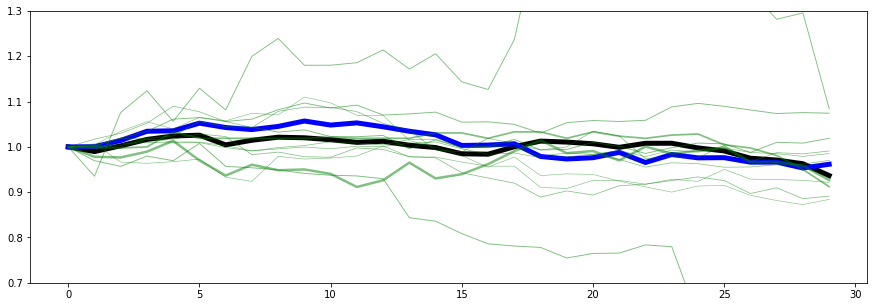

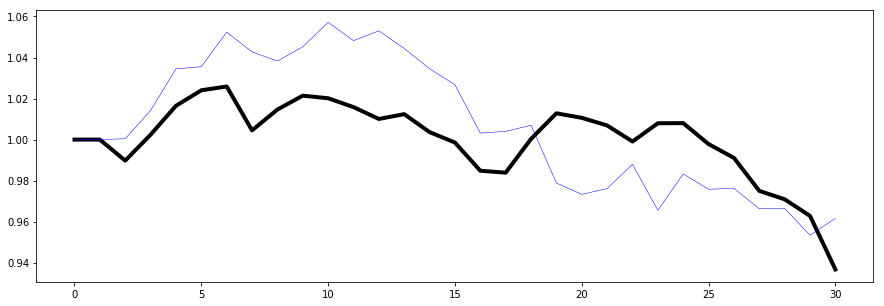

5.209766720725527


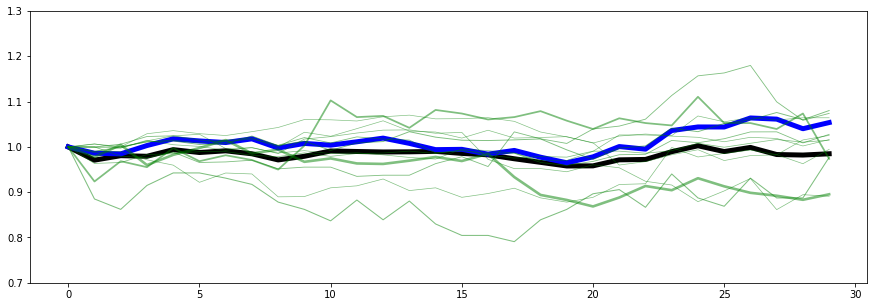

2.210419341200099


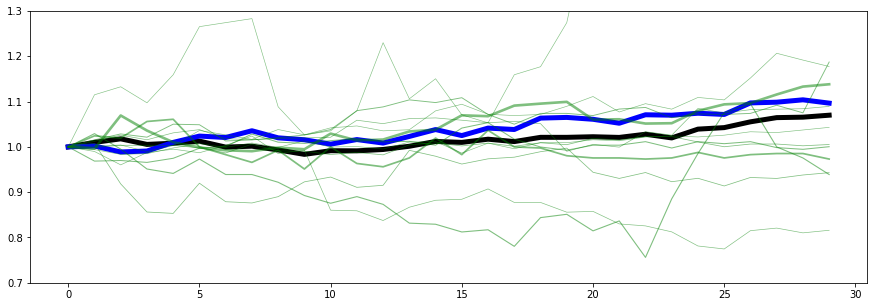

0.41088900862364647


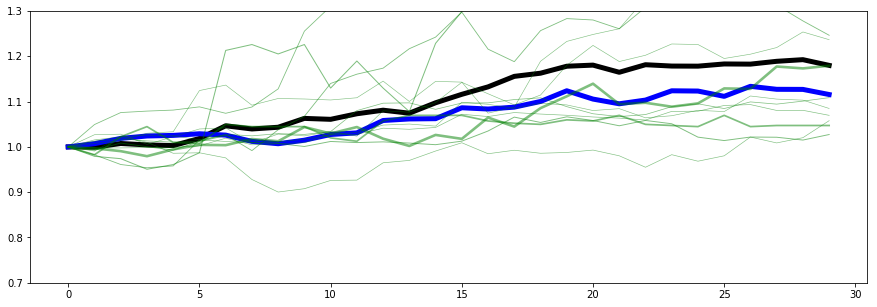

0.284185027493972


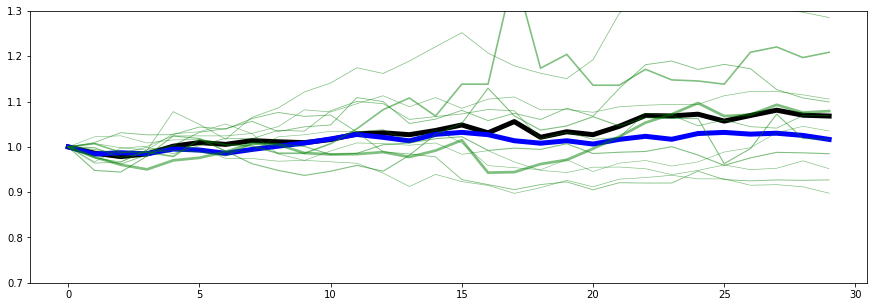

0.5099753842011685


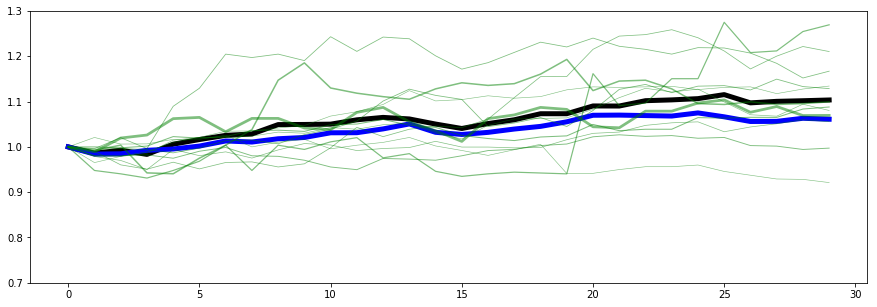

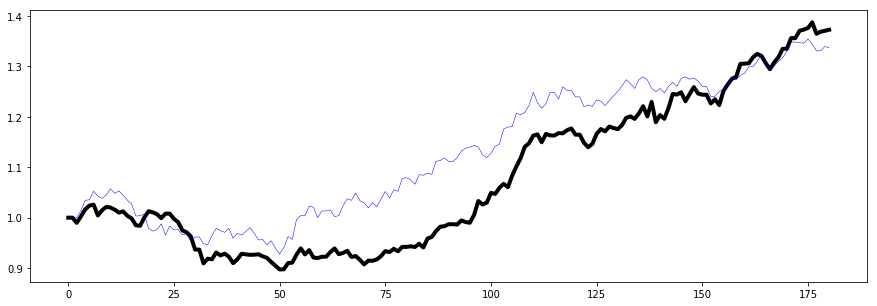

0.7519464511466336


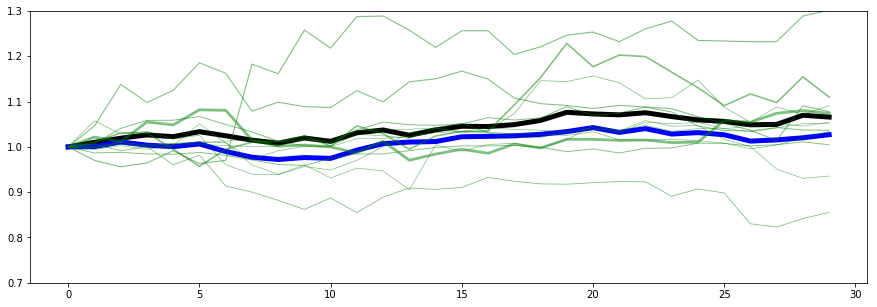

0.11630700398967984


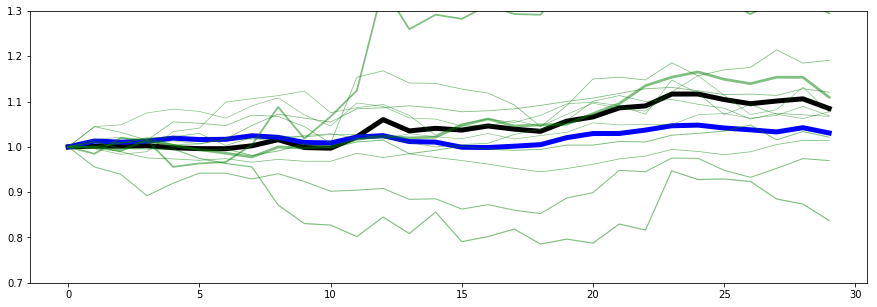

0.4482340921265811


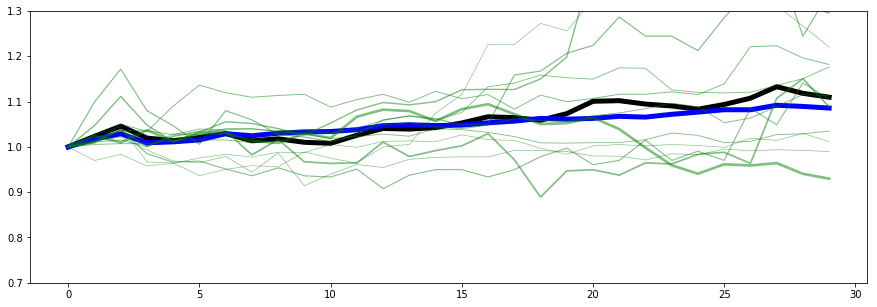

0.3466141466844443


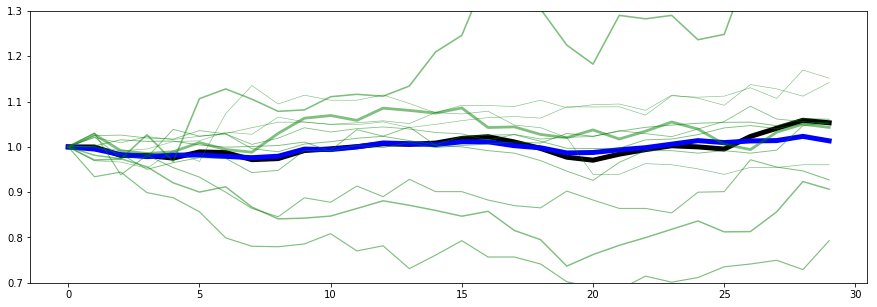

0.5398729704154022


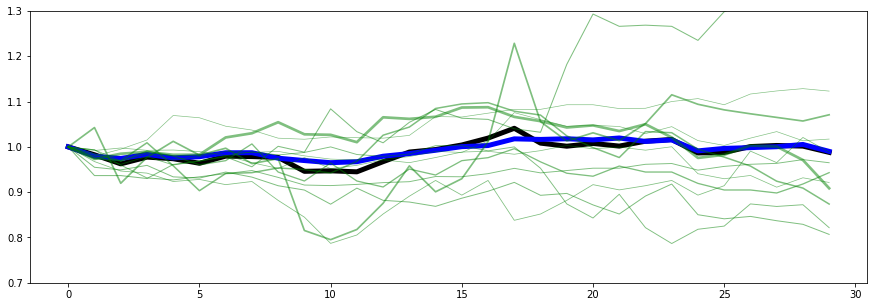

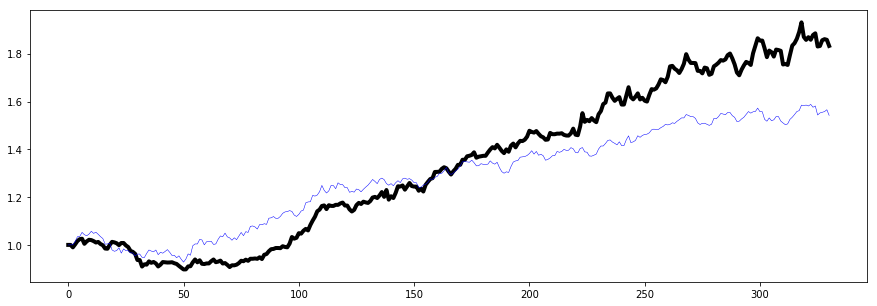

0.3006748233874373


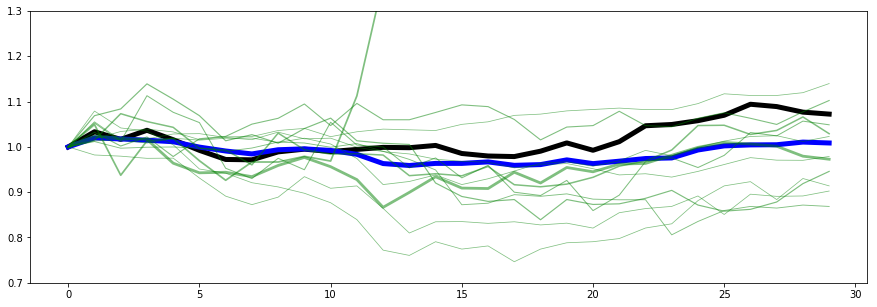

0.30441432917955485


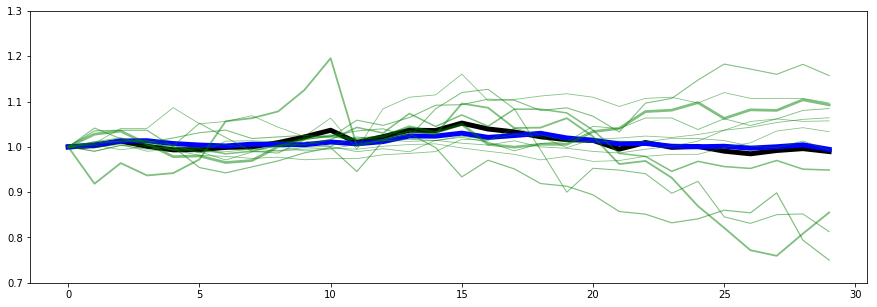

0.18266704081340454


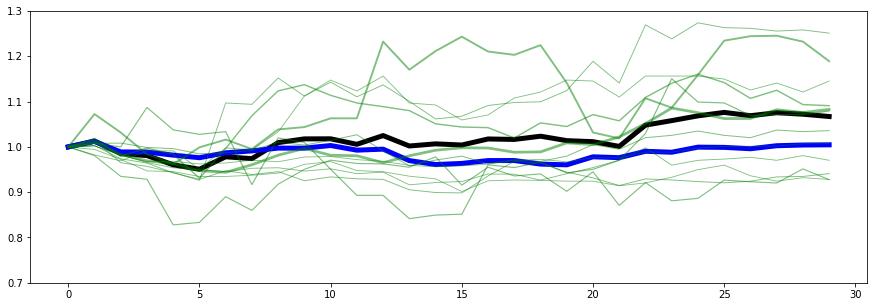

0.428979544362494


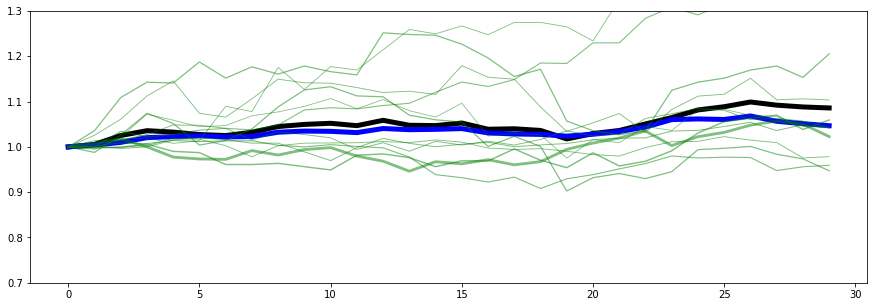

0.2560569565754632


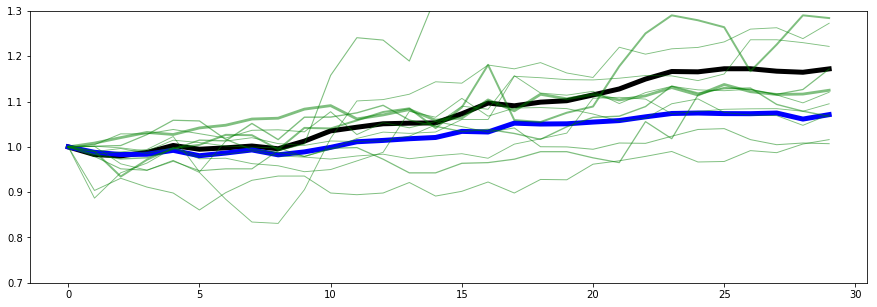

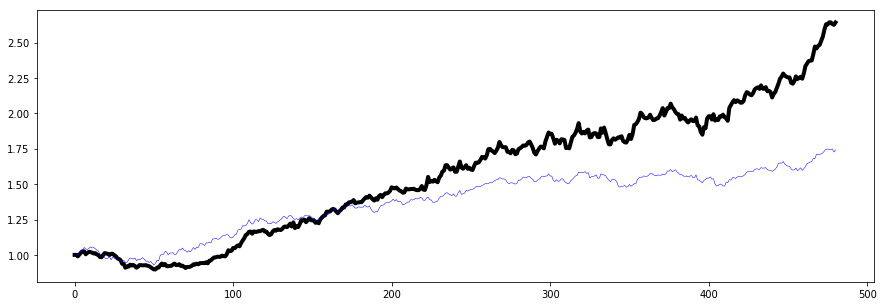

0.5245623653803789


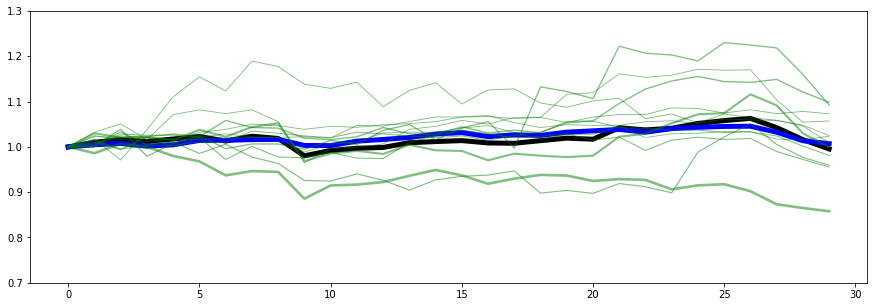

0.24995088401026053


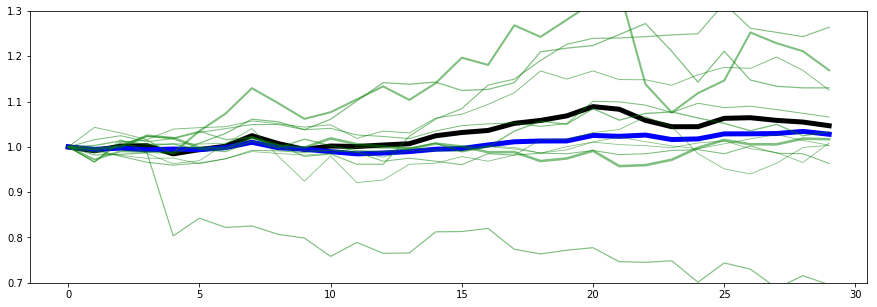

0.4647333100871761


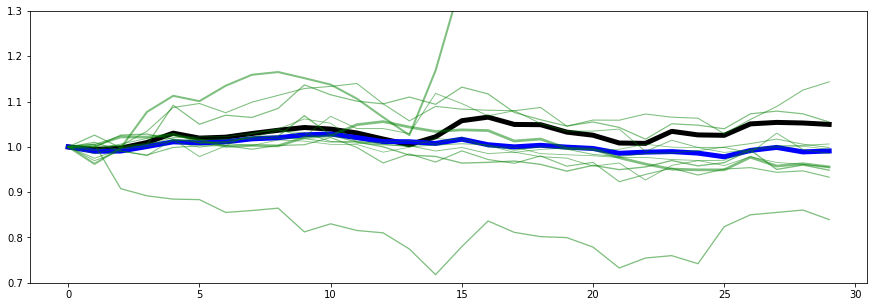

0.5060203341918786


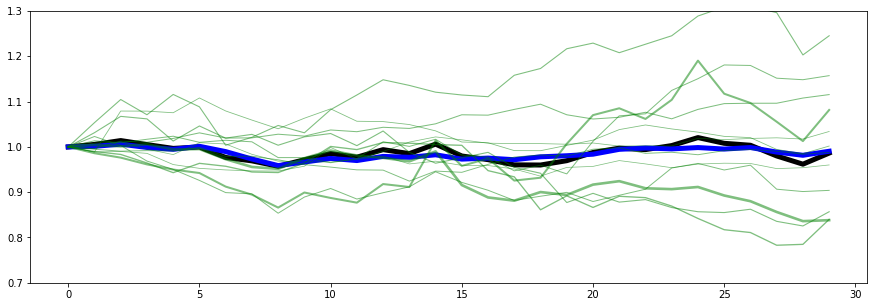

0.12937856830290828


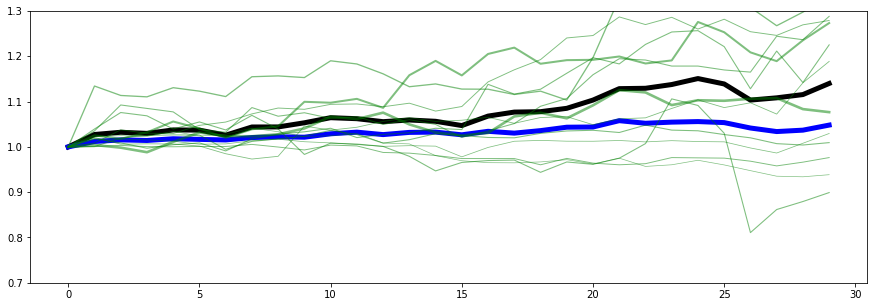

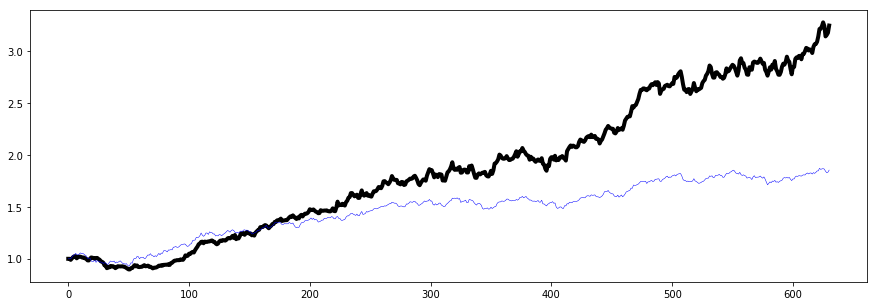

1.317706226330599


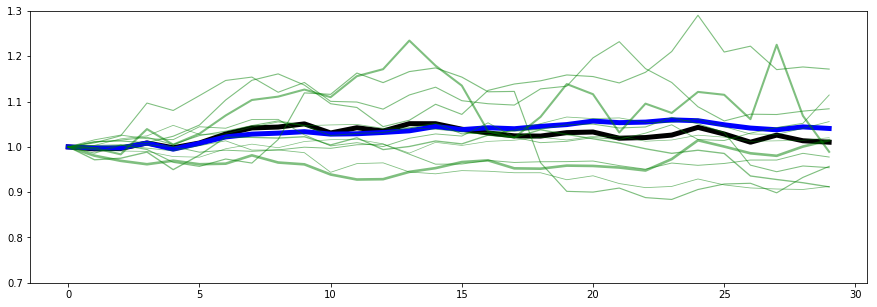

0.11194325813349551


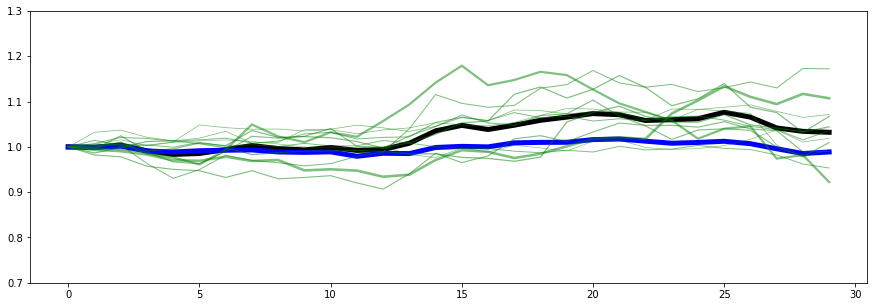

0.4384803029920926


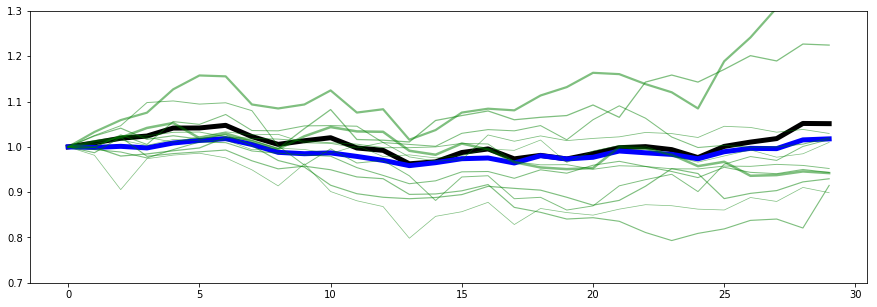

0.15495575824965865


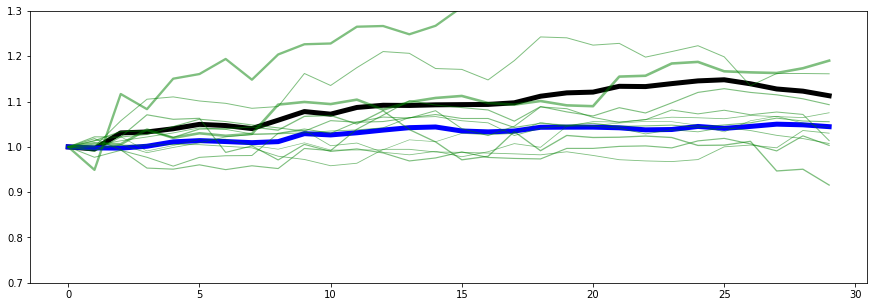

0.07840074807663838


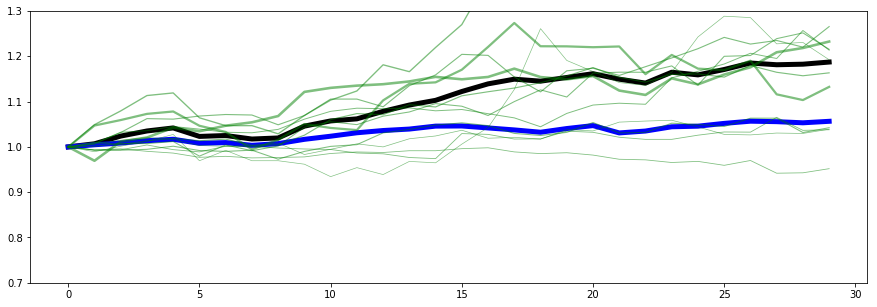

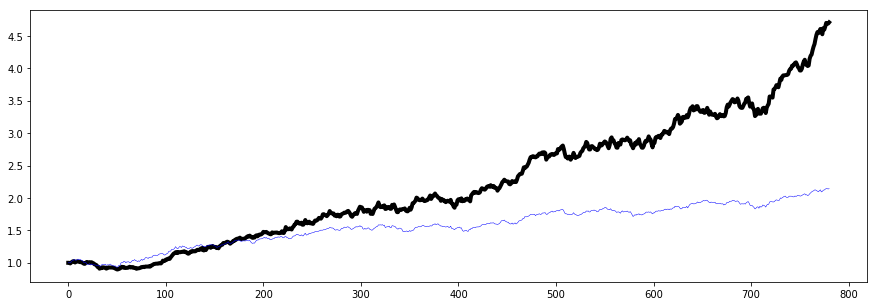

0.2148350101262652


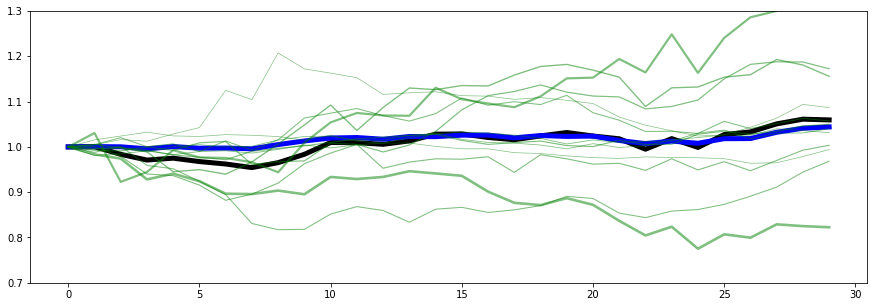

0.05353280964850594


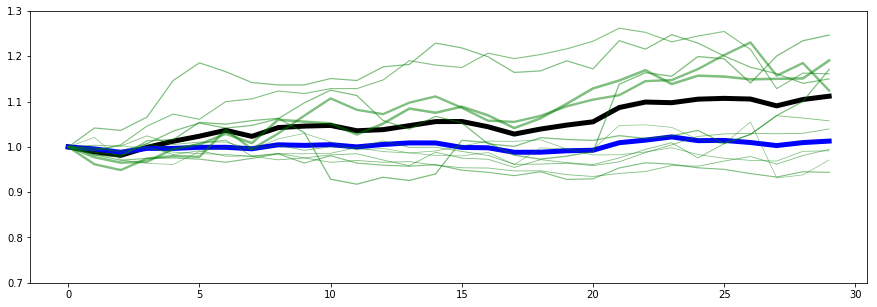

0.6637809803311634


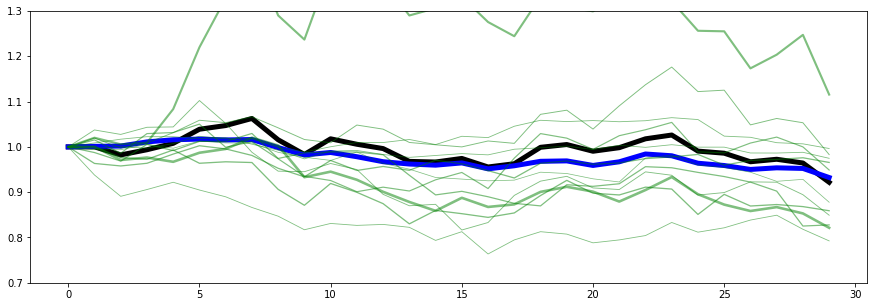

0.11192011910087091


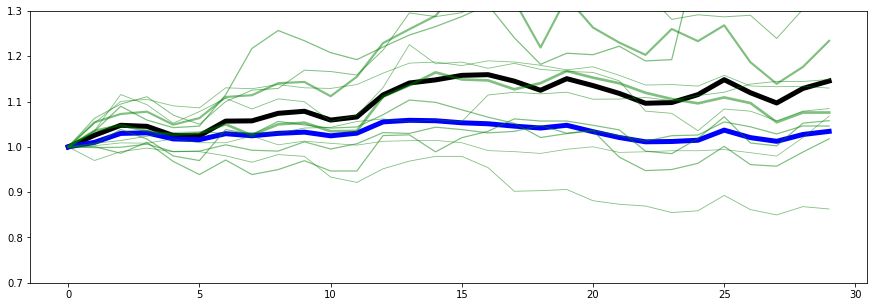

0.4019572548707026


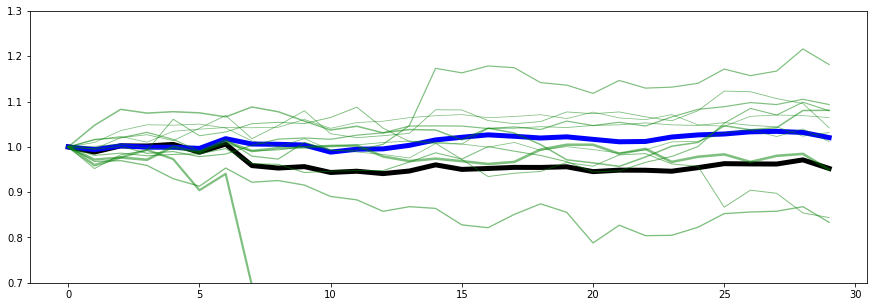

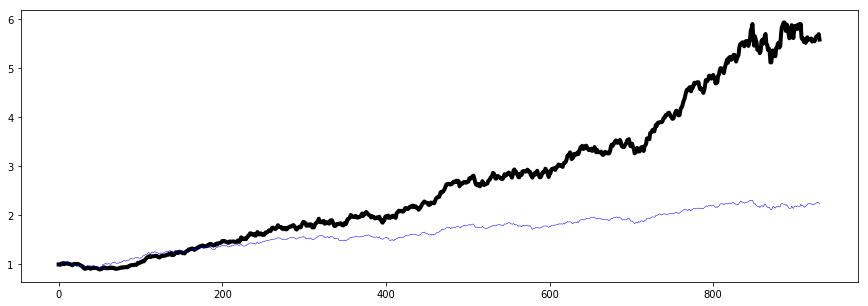

1.0849648164382657


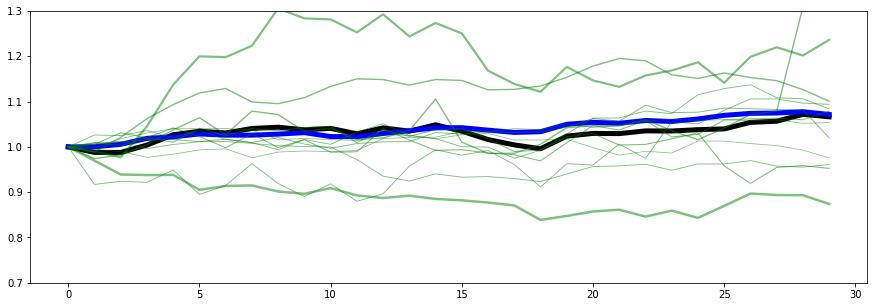

1.46896226697687


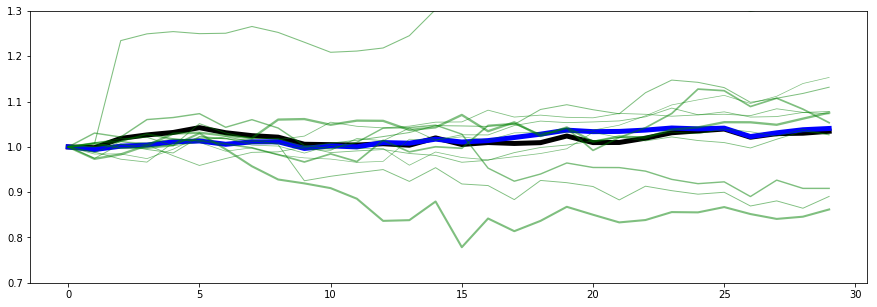

0.37573054523027155


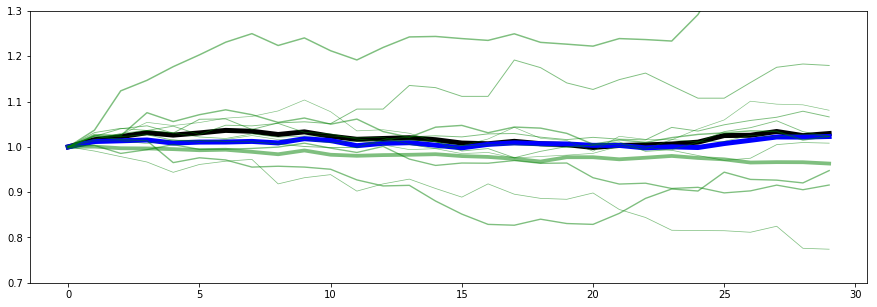

1.297838792418682


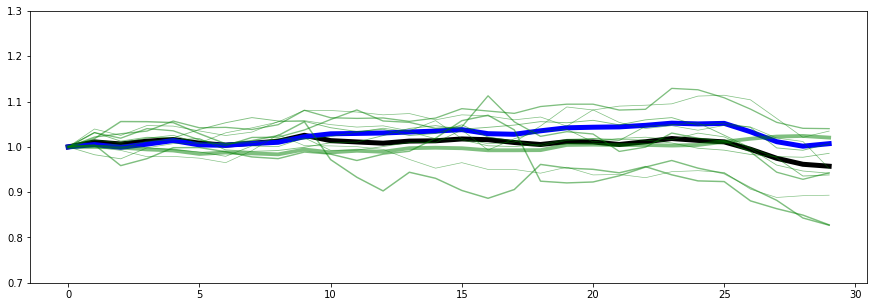

1.2191583194740818


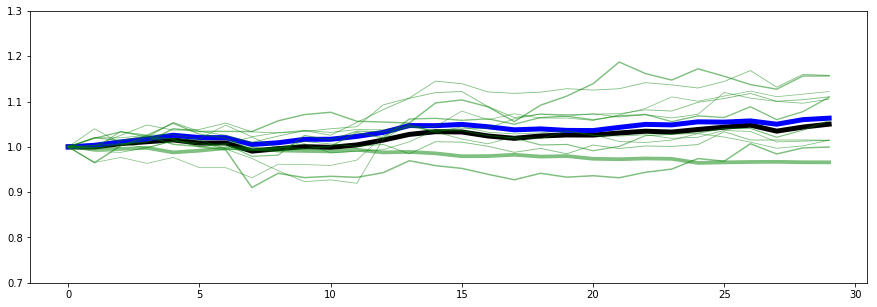

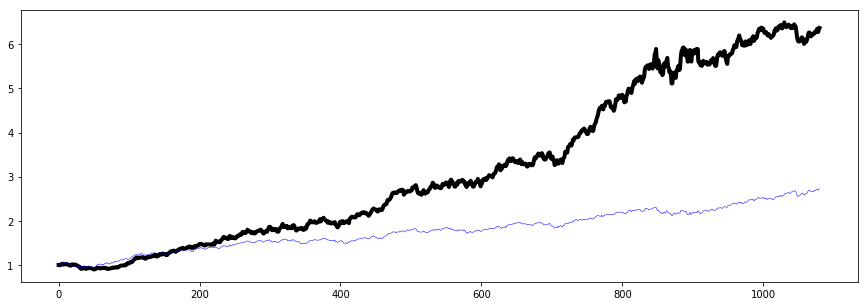

0.7856129752979817


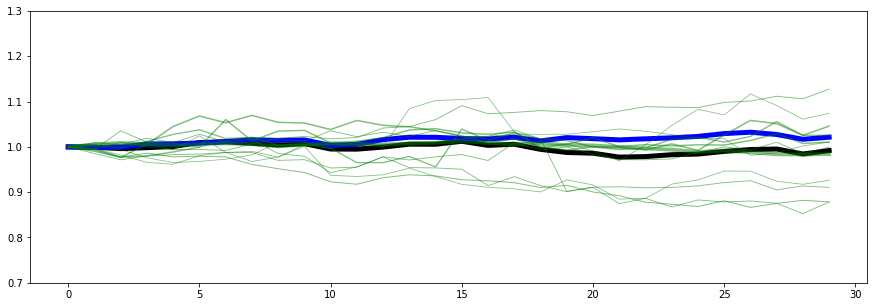

0.48093309331629513


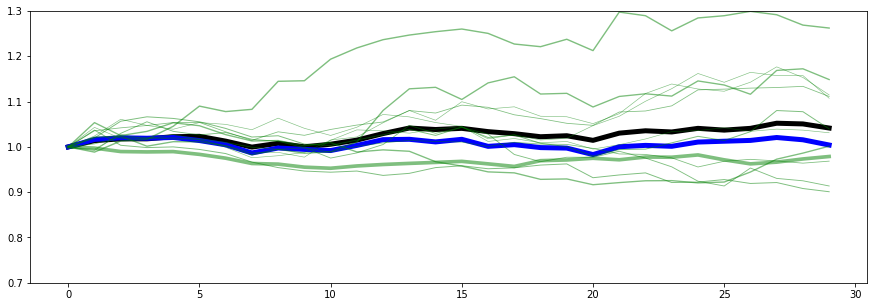

8.215114812983392


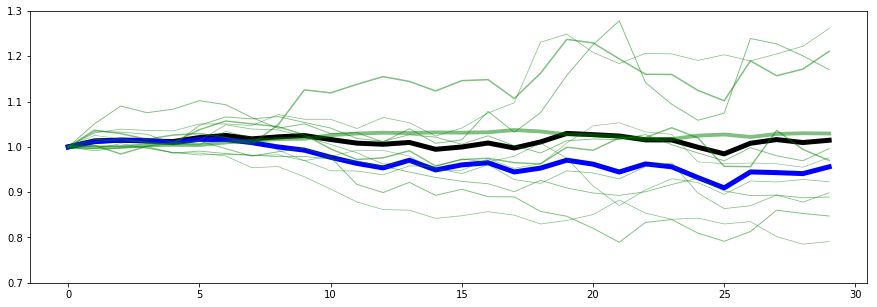

0.39295419883832966


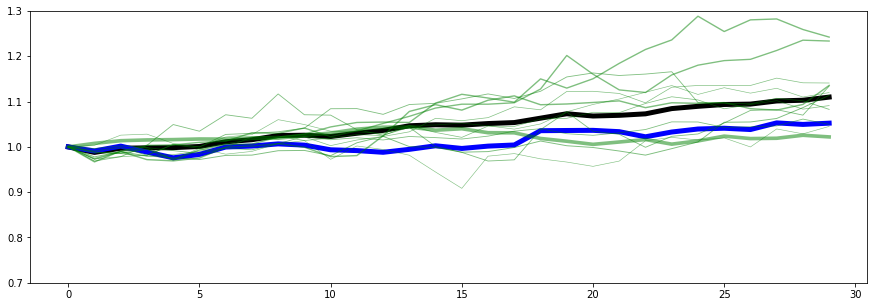

0.6843868982599403


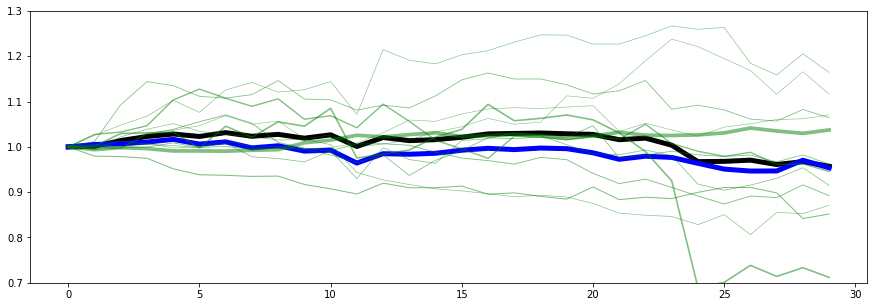

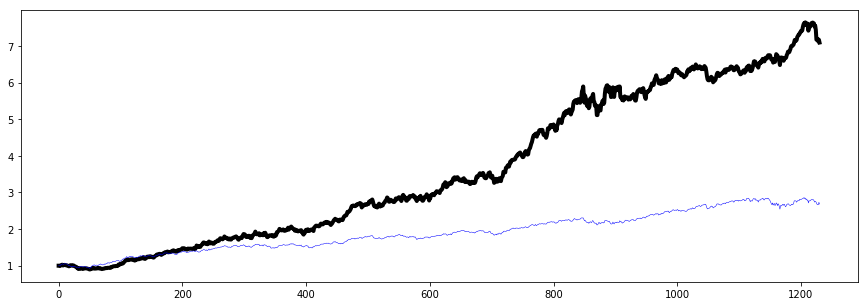

0.8123784453981827


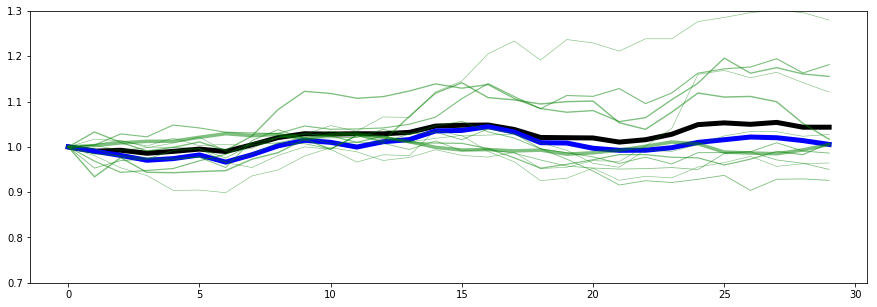

1.3913837452750846


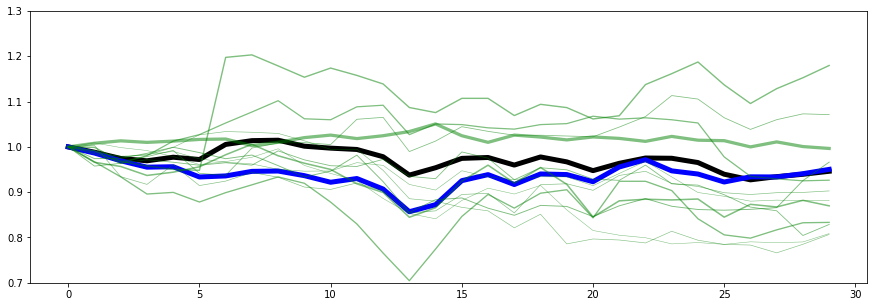

1.4547679786157557


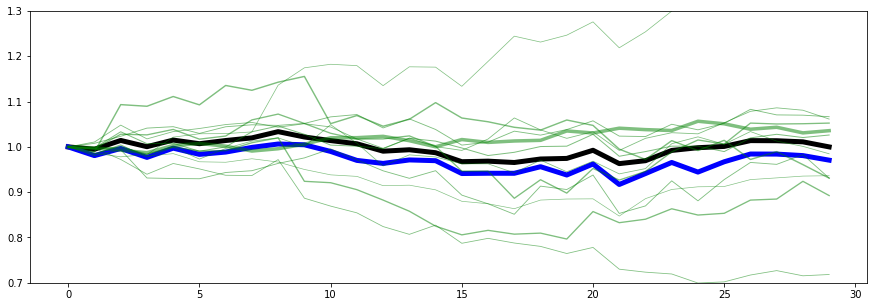

2.8023825895676757


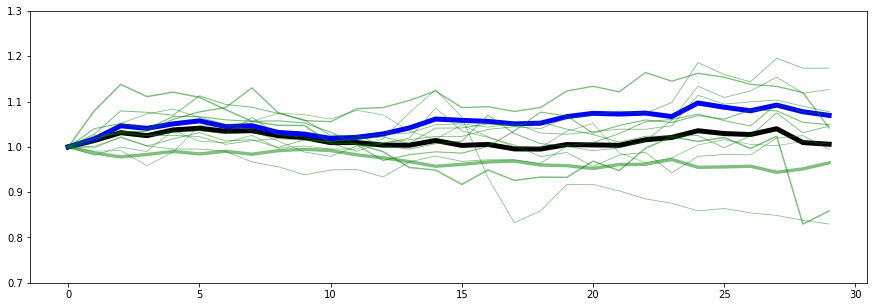

3.893429973247257


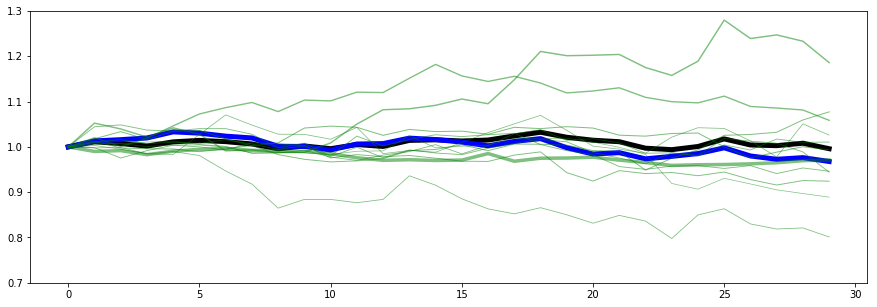

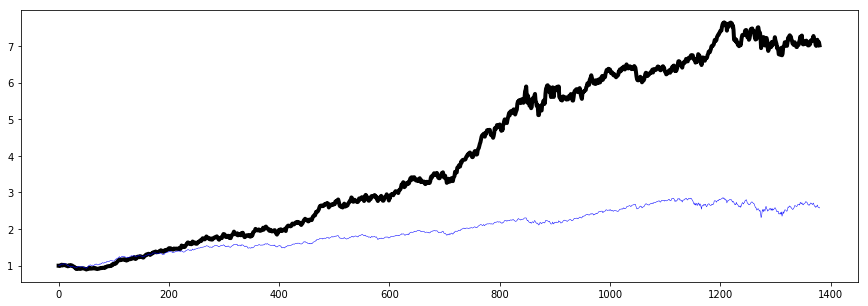

2.1191271882676586


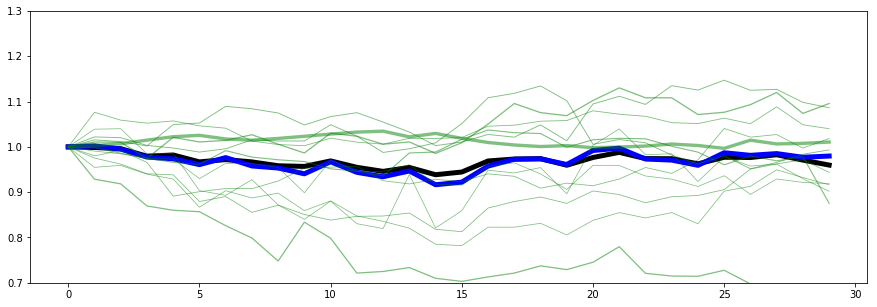

1.1084313069180254


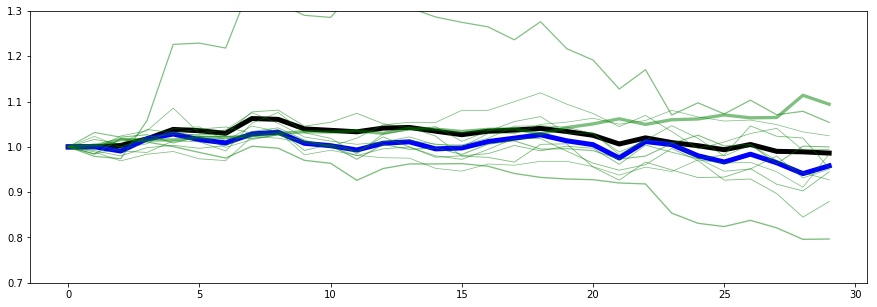

1.6365037370405027


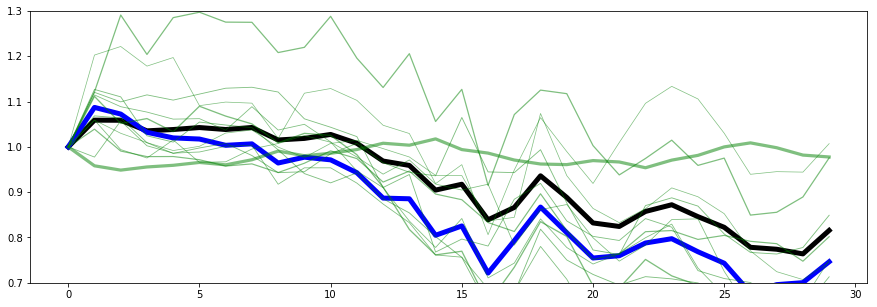

3.4424384856169414


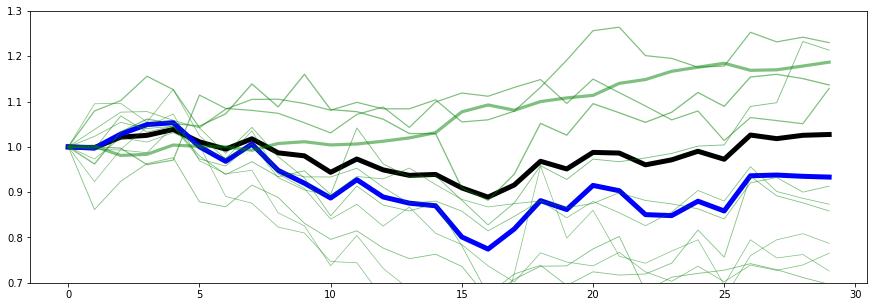

2.7444750600986176


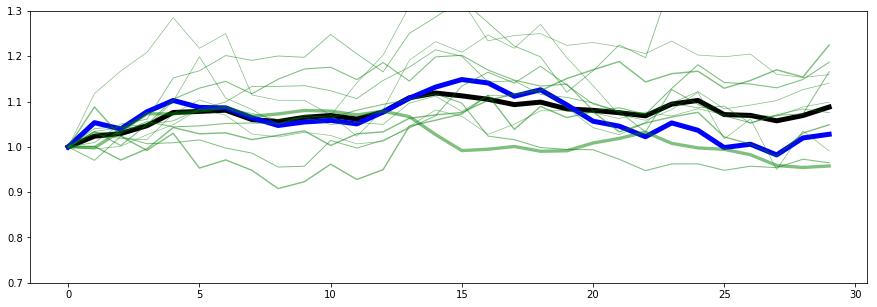

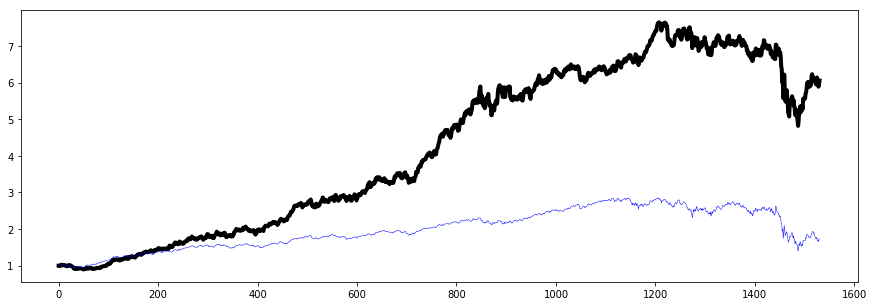

5.124042558482521


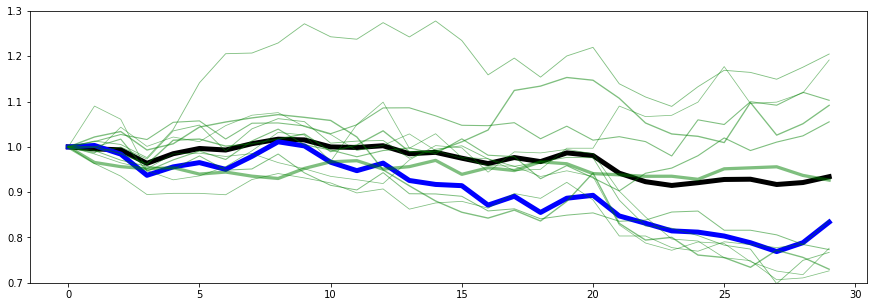

4.516329734732274


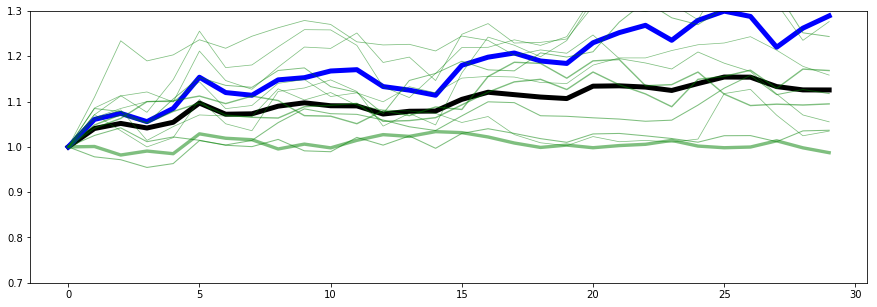

7.218819781054771


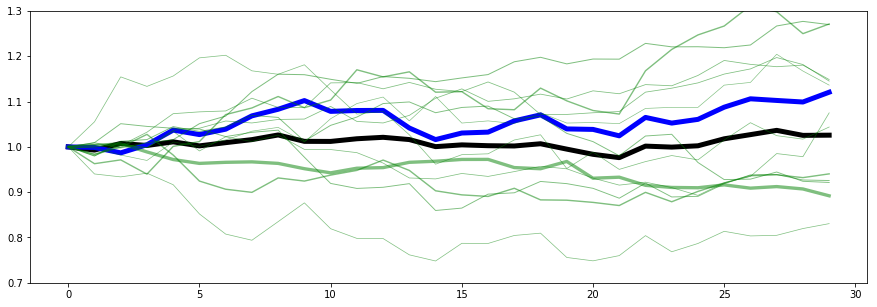

3.969714553264941


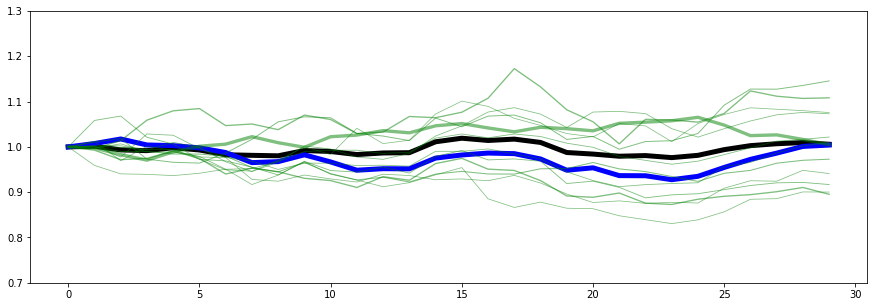

1.9476240952705262


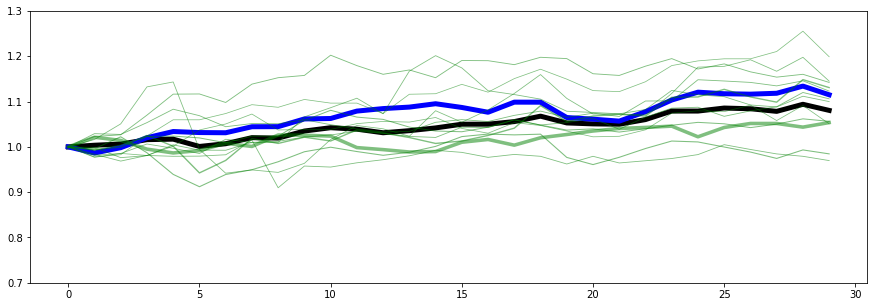

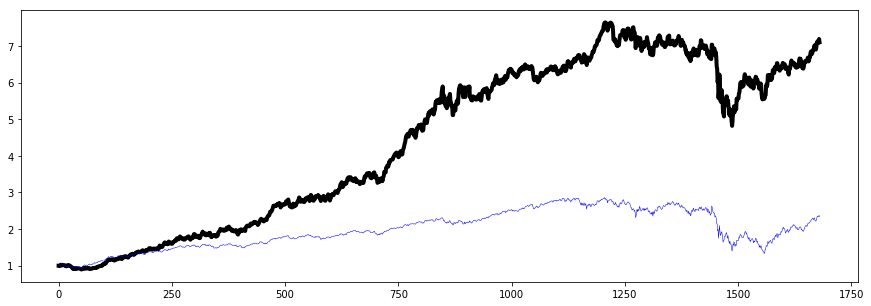

1.5867143041683944


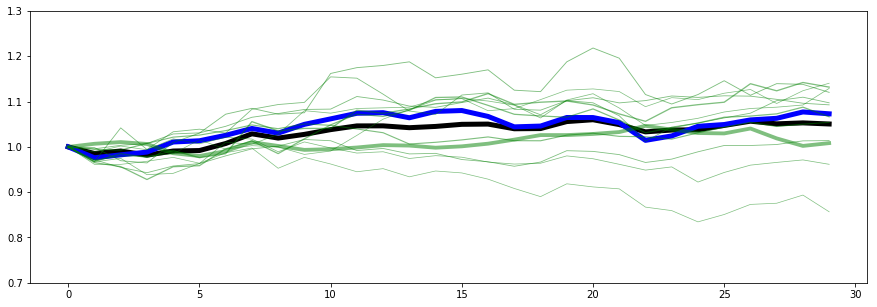

0.9859226833478147


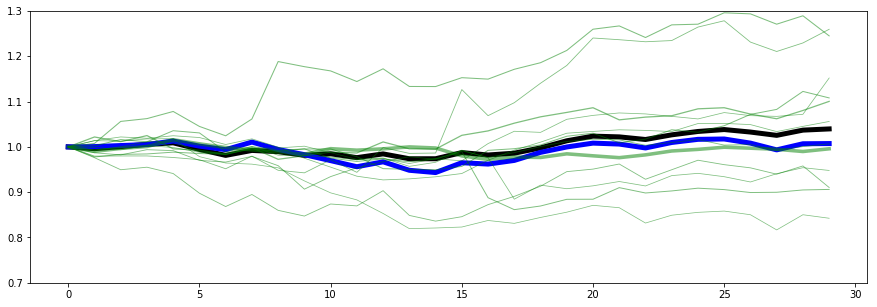

9.148732559608161


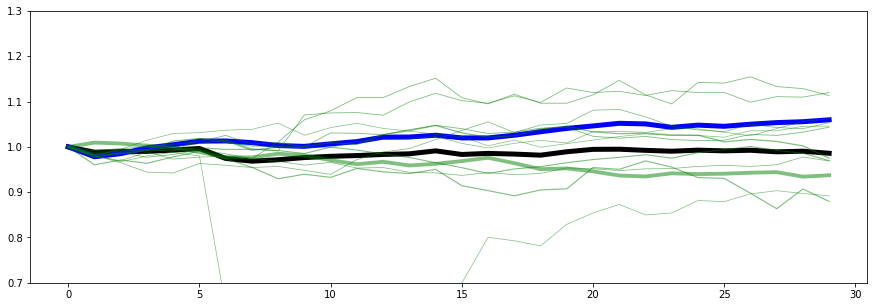

4.994628076421535


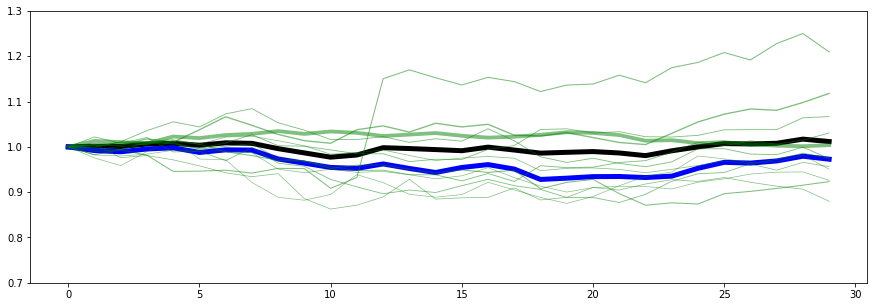

1.992673972009281


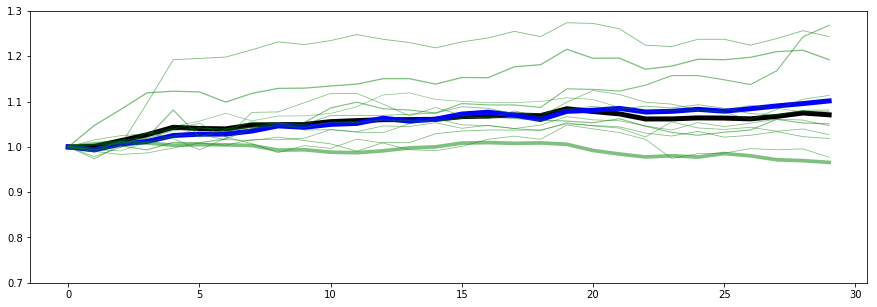

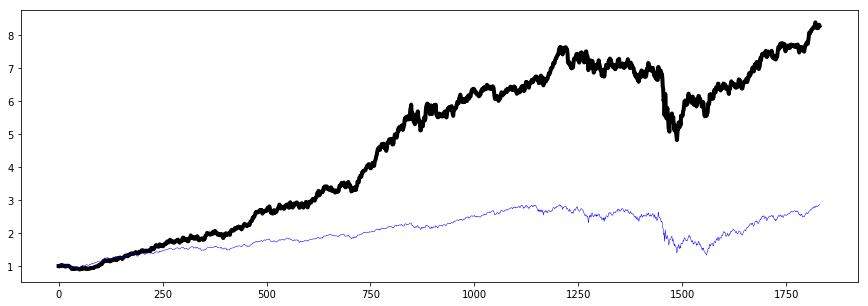

1.9533626347908692


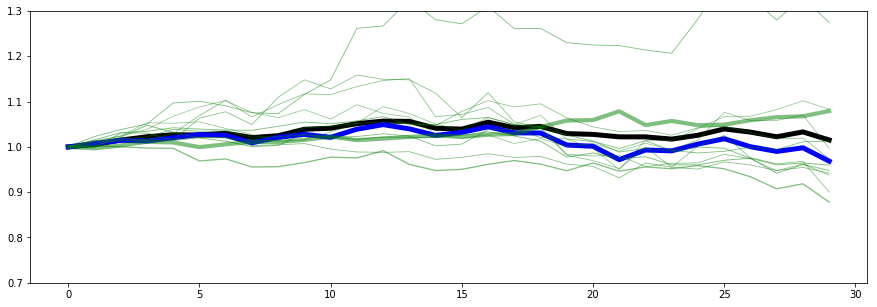

3.901863014518516


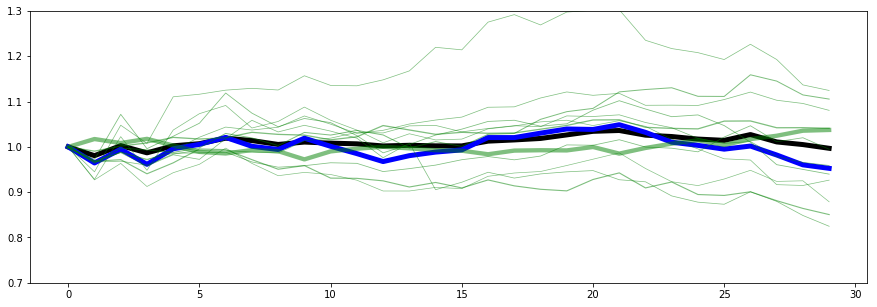

2.5157686797174303


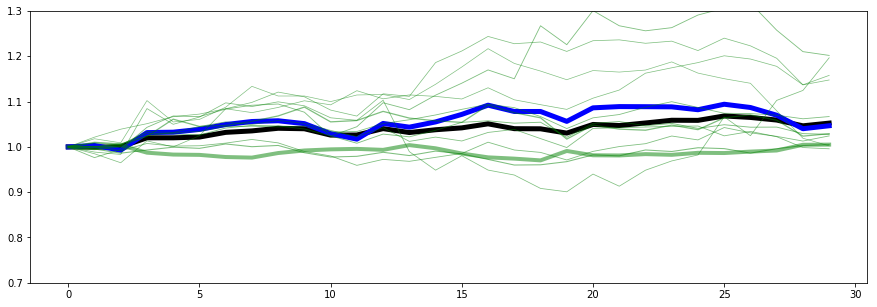

2.3261532706528243


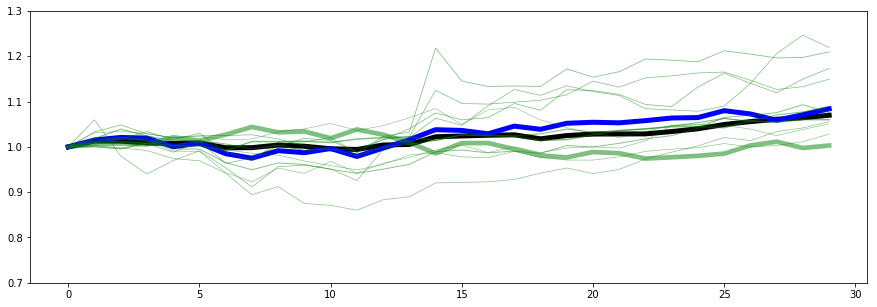

3.956015514491067


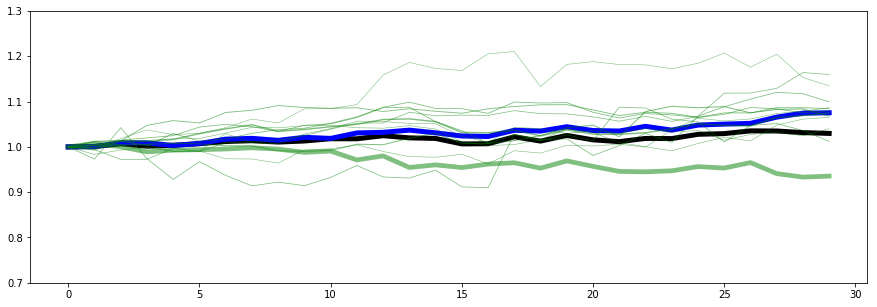

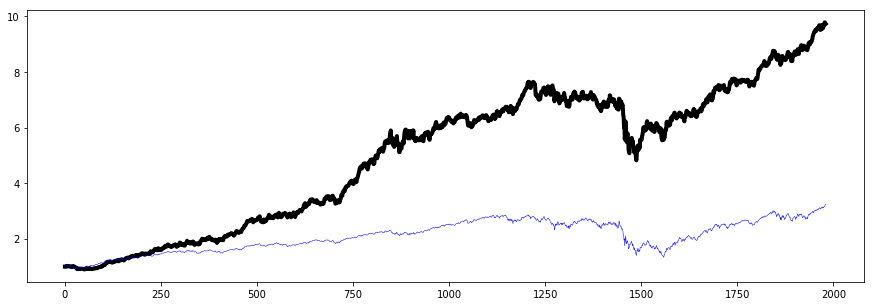

2.960888788568898


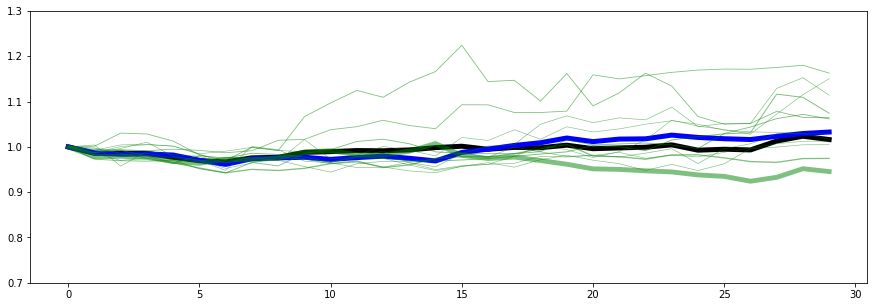

1.9507314989429754


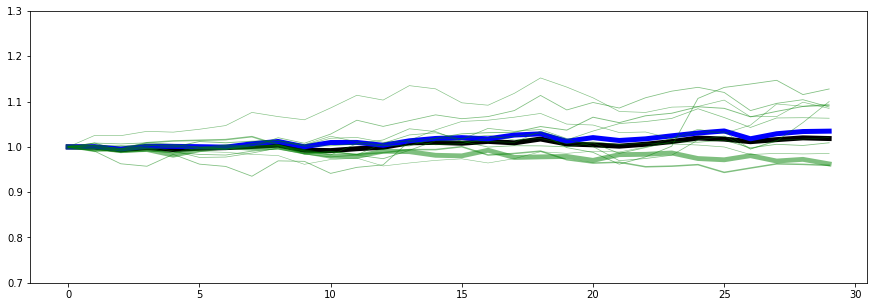

0.8987187656012456


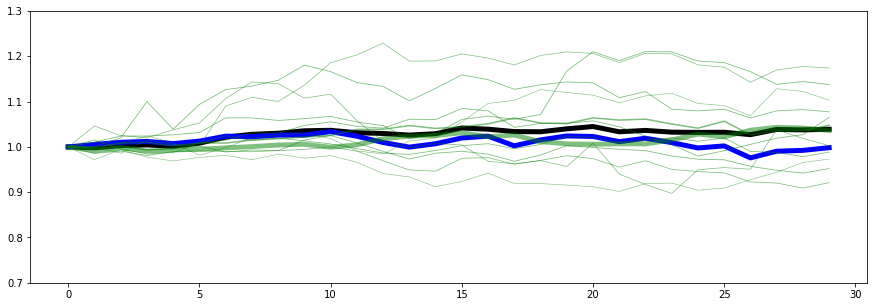

1.0283380282042636


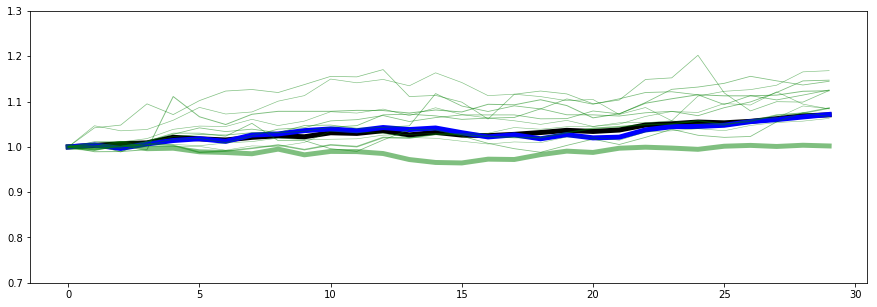

5.984460852157636


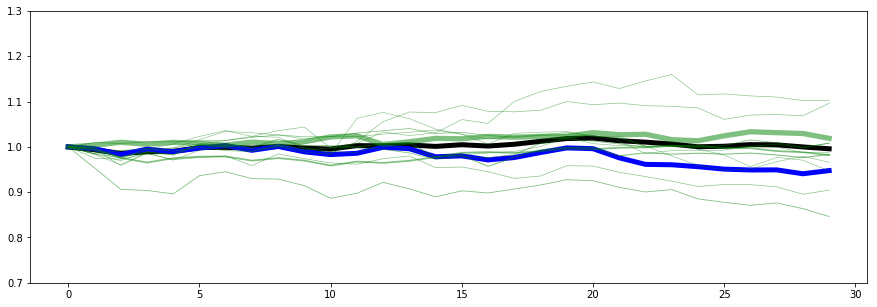

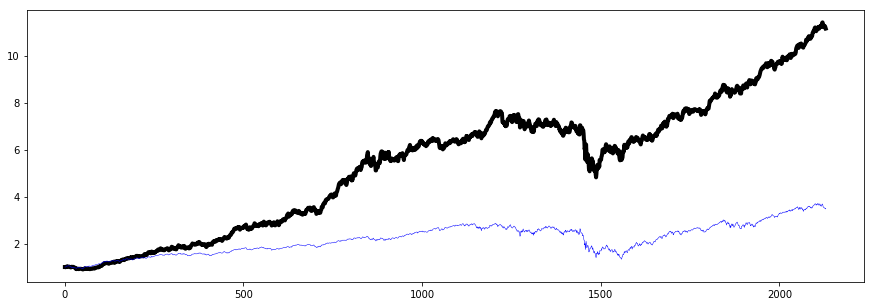

1.954486161276878


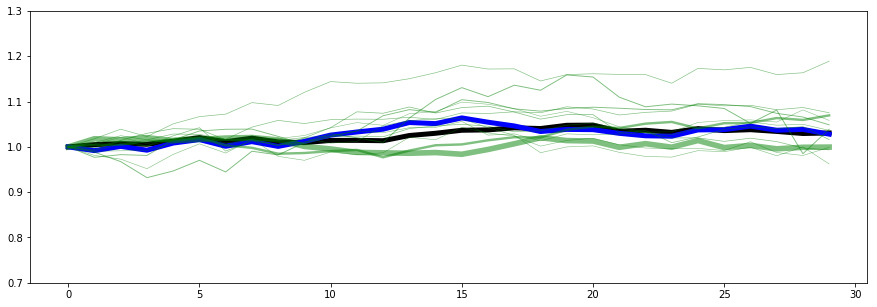

7.295034614521095


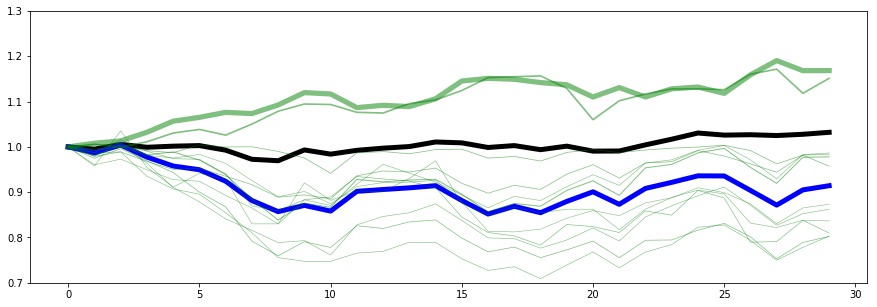

11.958068636054193


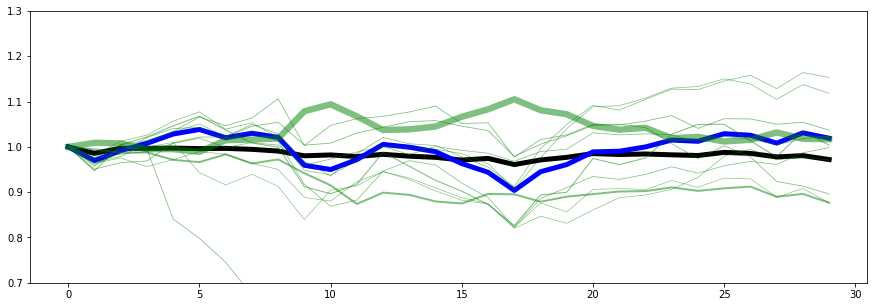

5.131030686134601


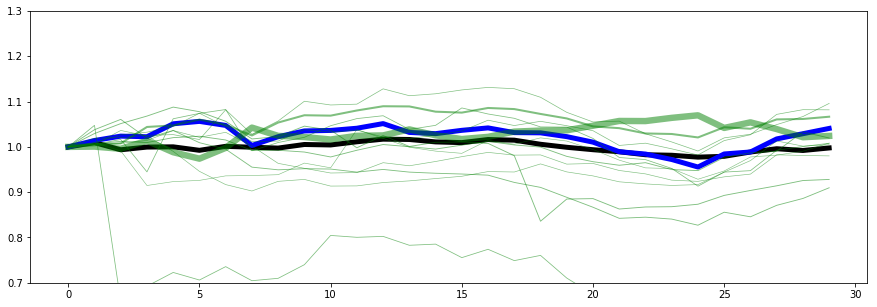

1.8162710936589403


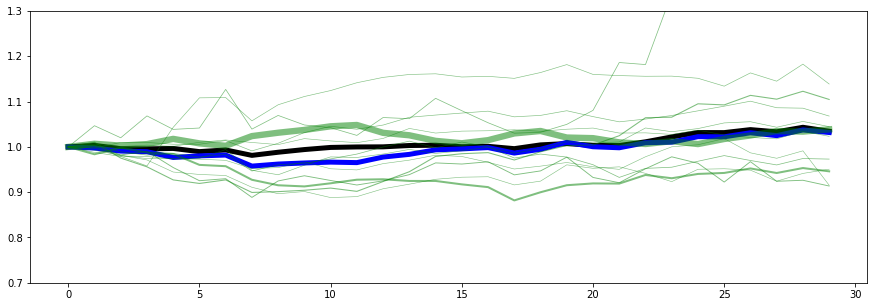

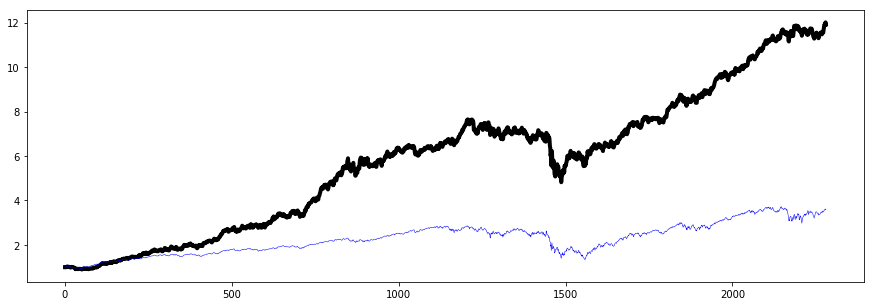

2.474002385472873


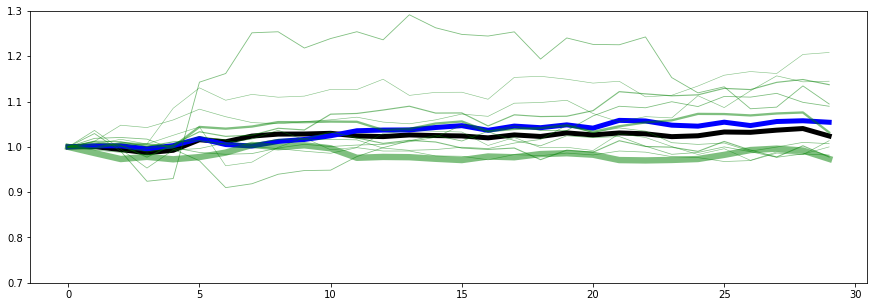

2.718805175332355


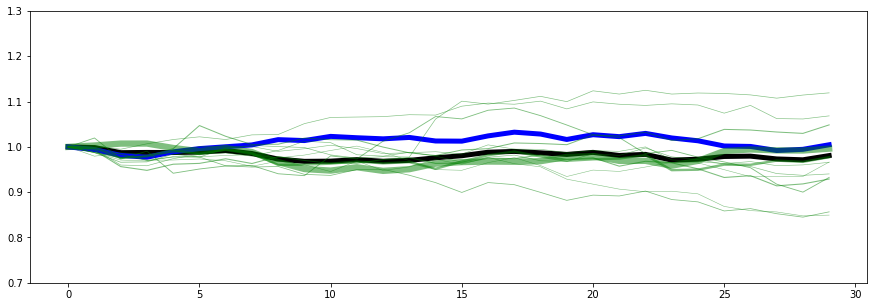

15.847841121271829


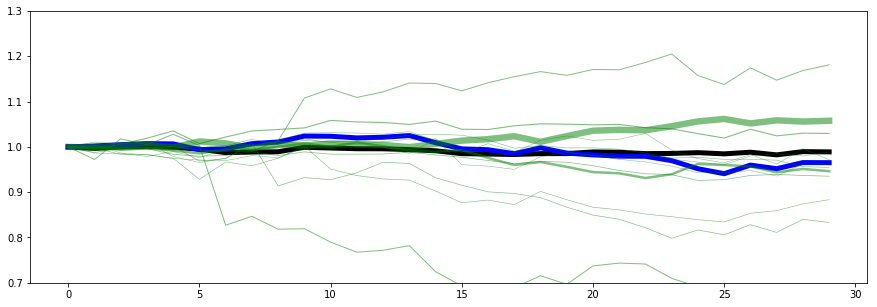

5.042257853757218


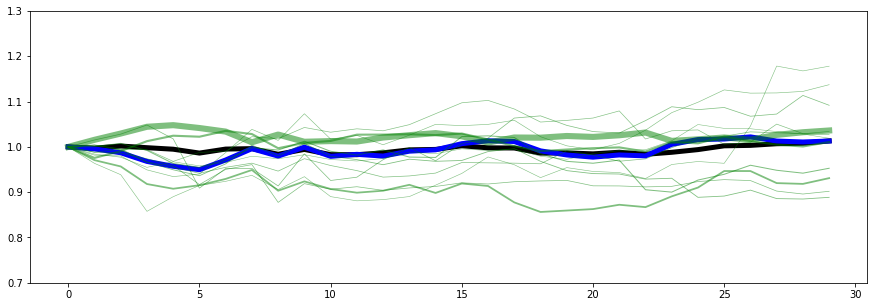

12.337143721124425


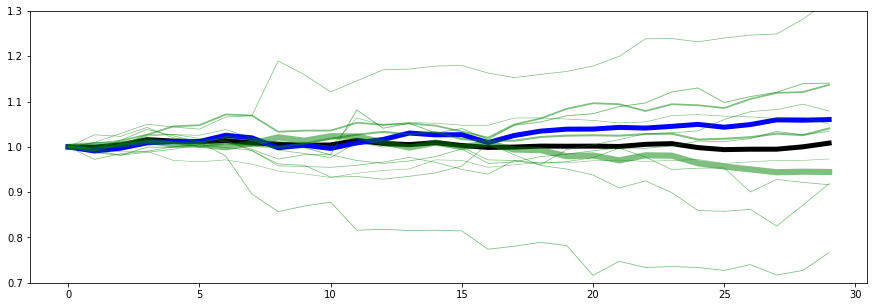

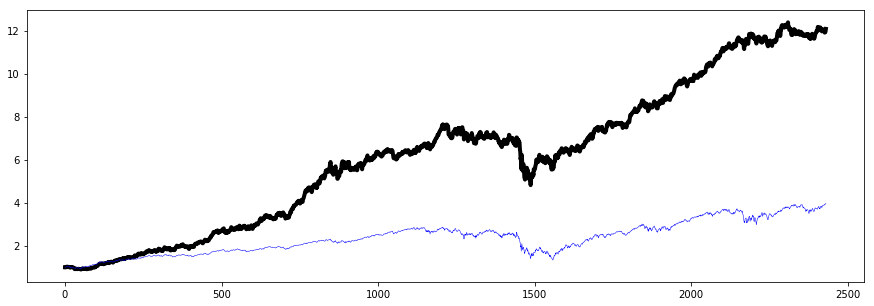

8.168640208564884


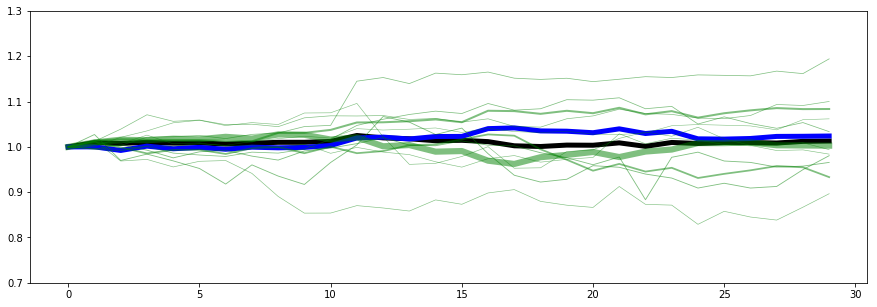

2.7943409453174177


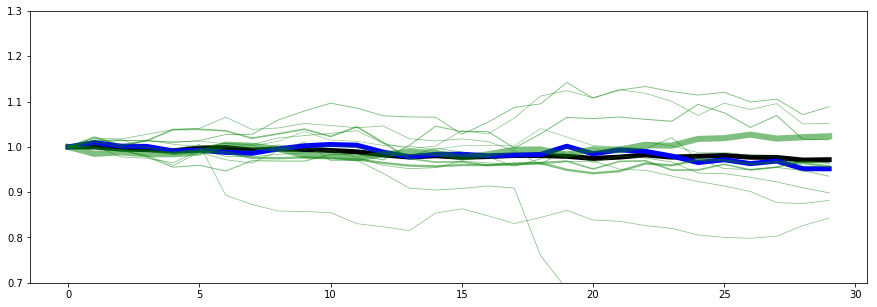

11.631165378994087


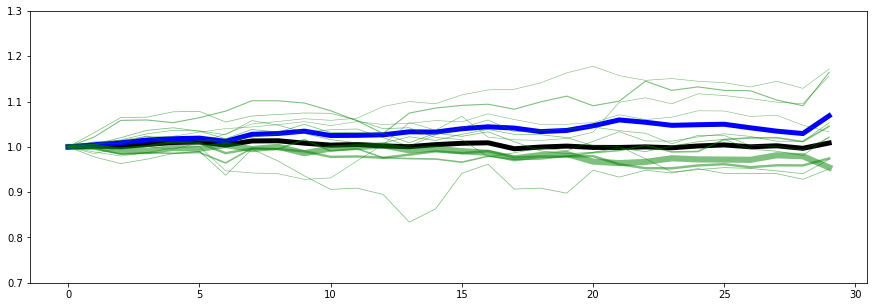

6.843496803059063


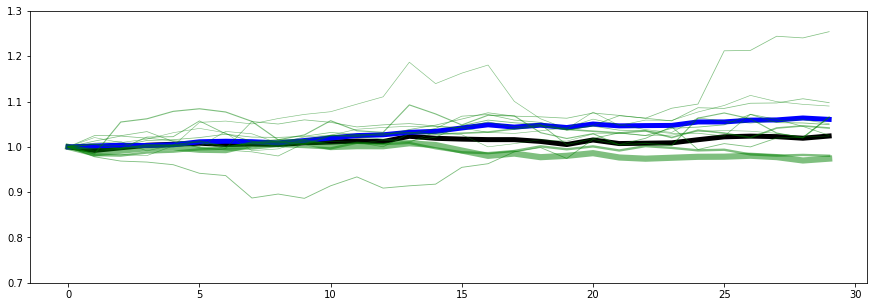

1.290654713735913


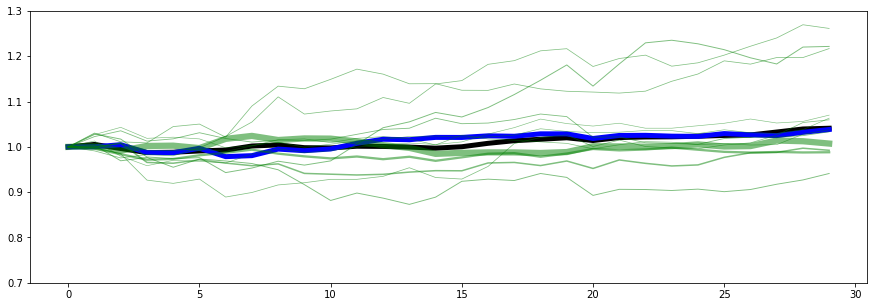

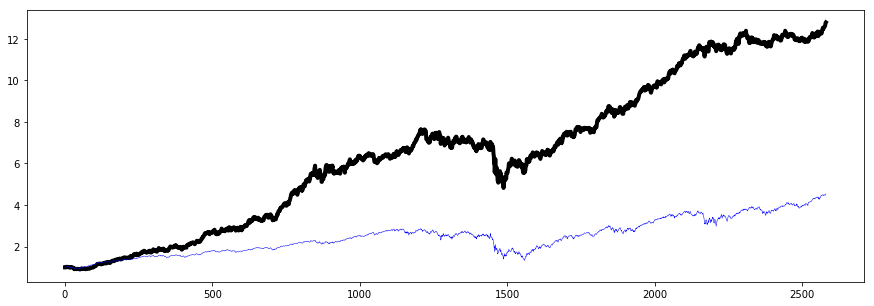

1.4808624739106222


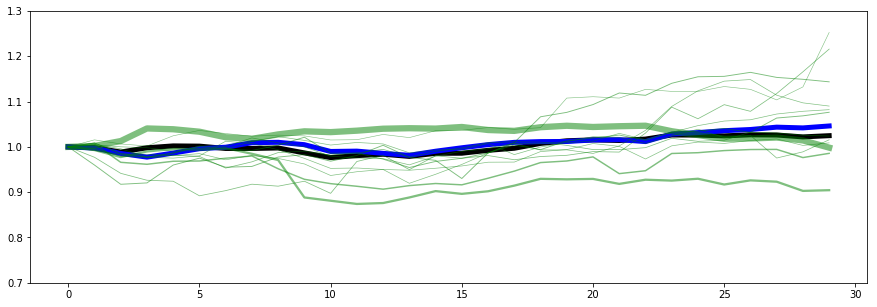

0.9743187485581274


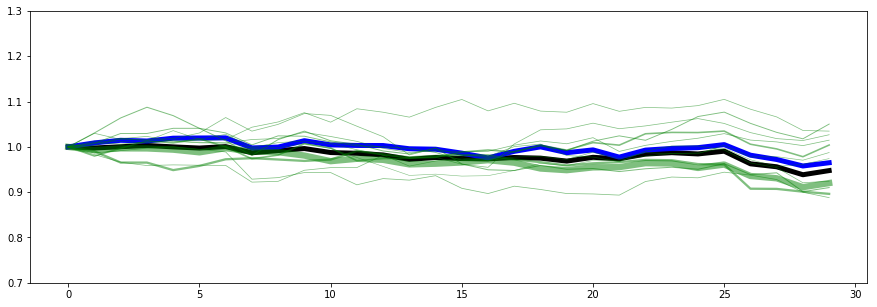

2.1737243866060214


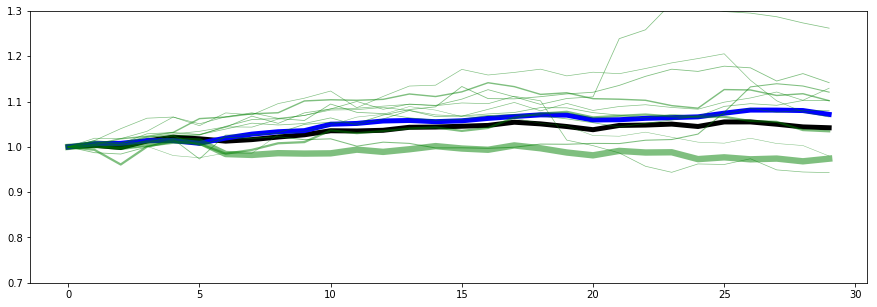

3.675822857917588


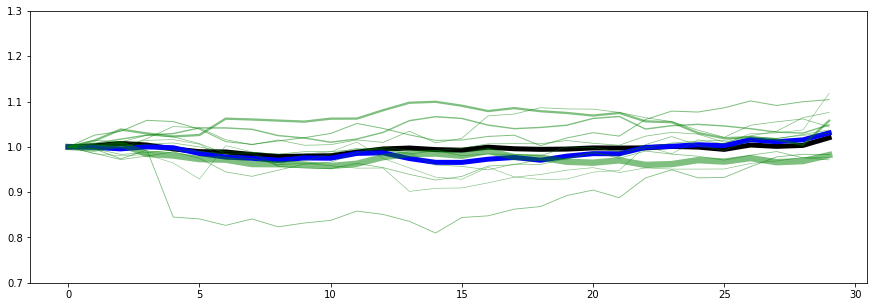

1.9974669956713575


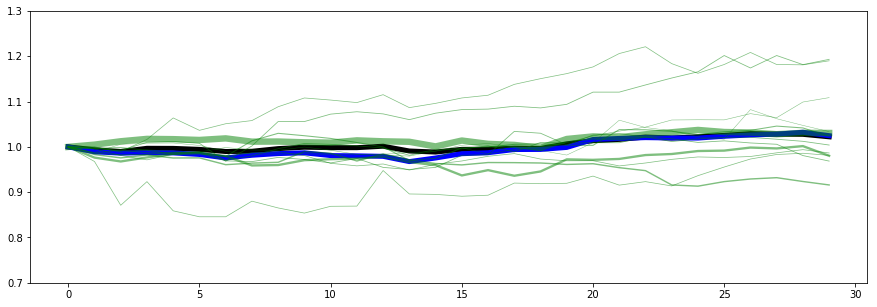

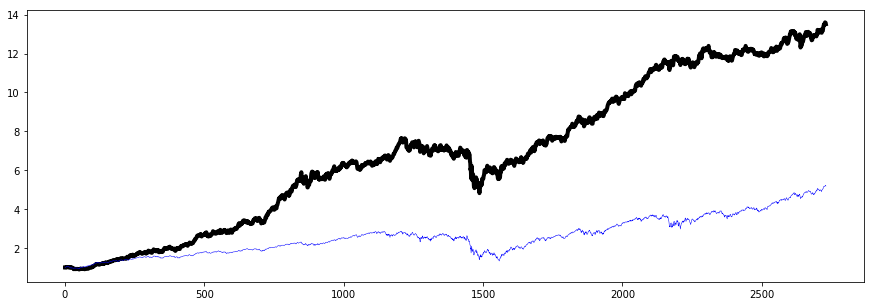

2.0992169395192084


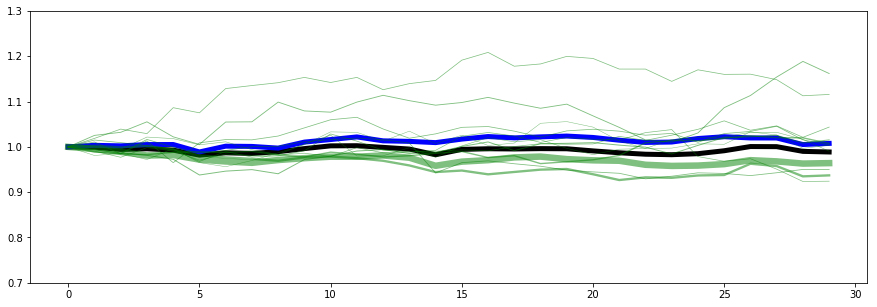

2.256098339988967


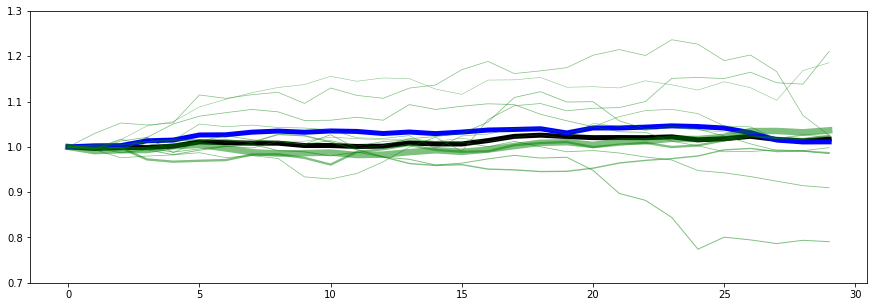

2.5012960906430592


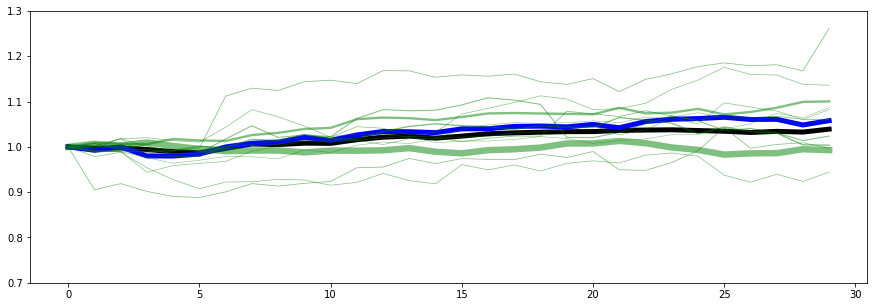

11.102124866165582


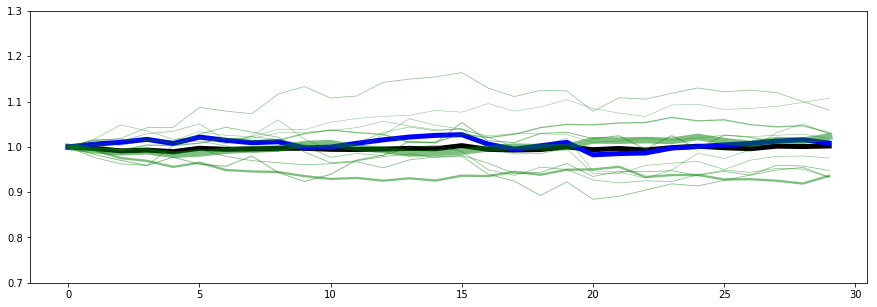

4.310850951481238


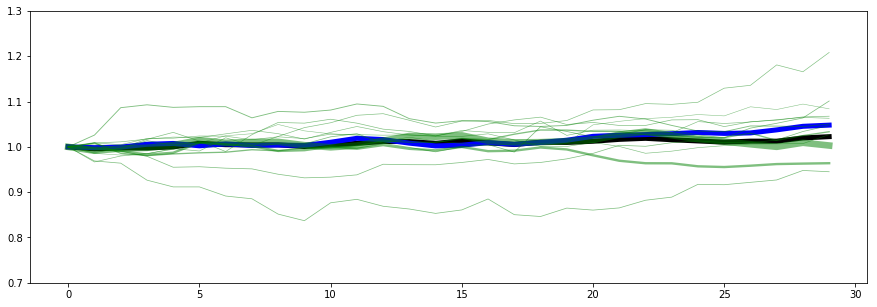

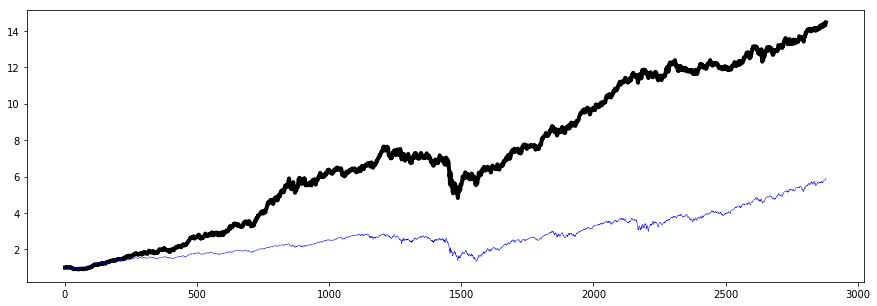

0.4980193412008261


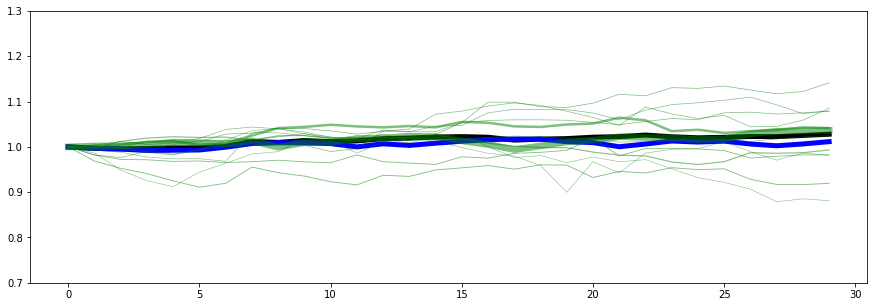

5.050507328451732


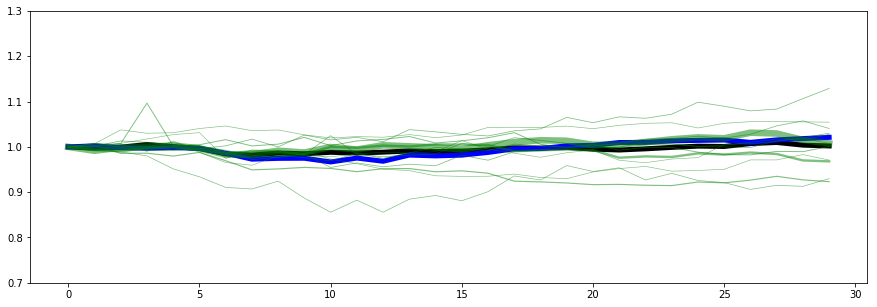

6.438080212821105


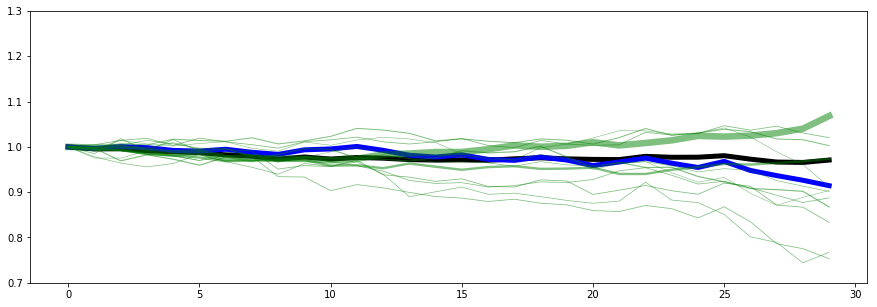

3.229217784860103


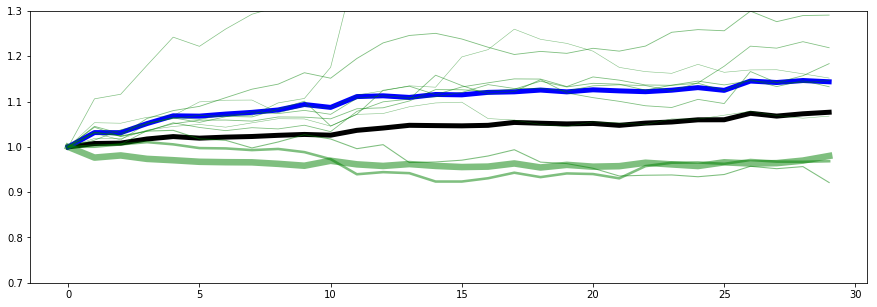

7.538796591730543


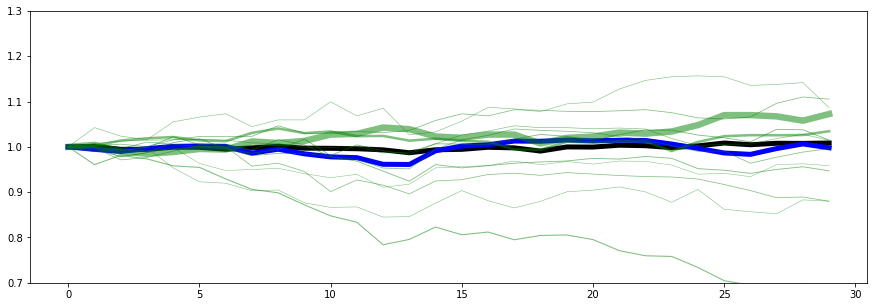

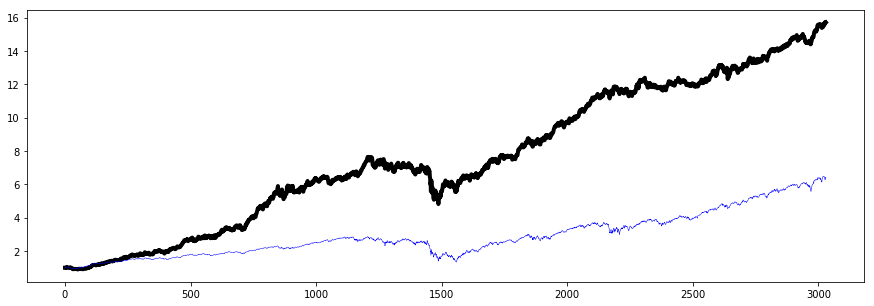

4.2408167984182725


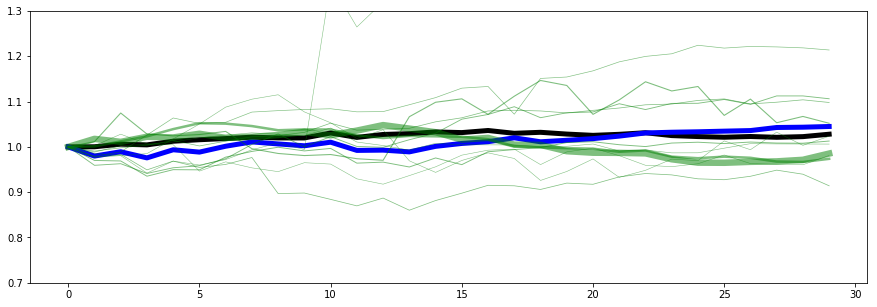

0.6525955875633659


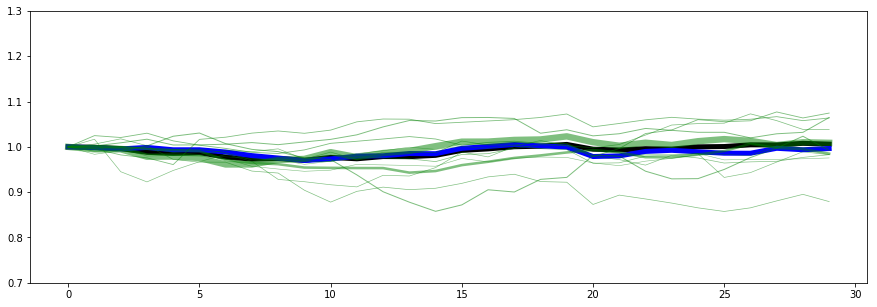

0.3662225988415379


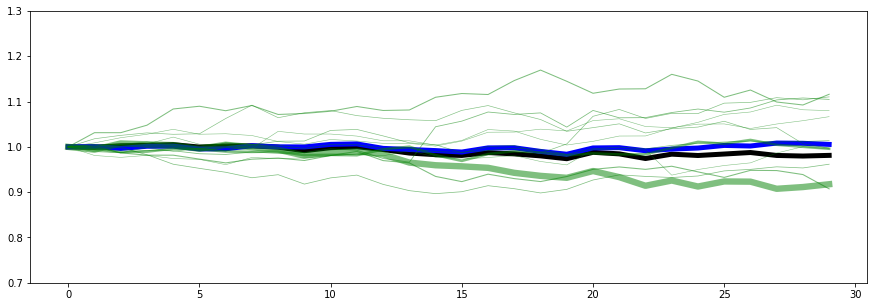

0.9800786785410943


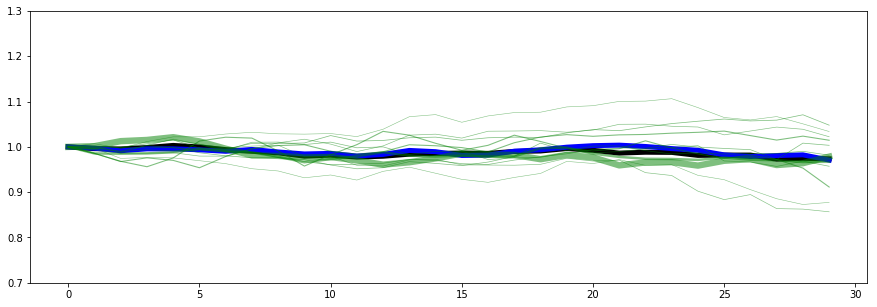

1.0526278721532203


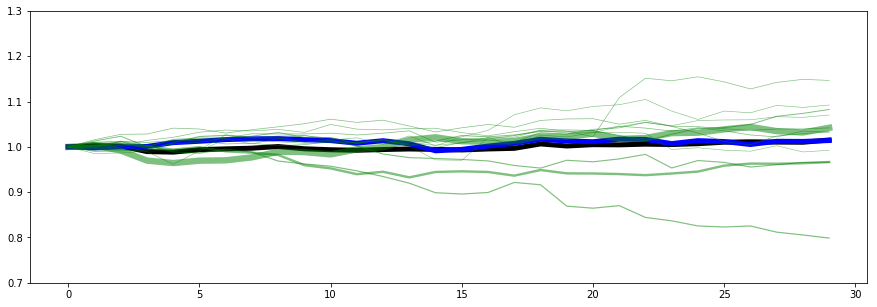

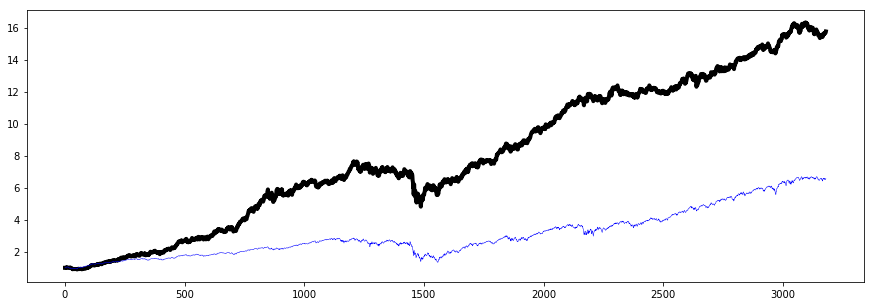

5.8168592769085095


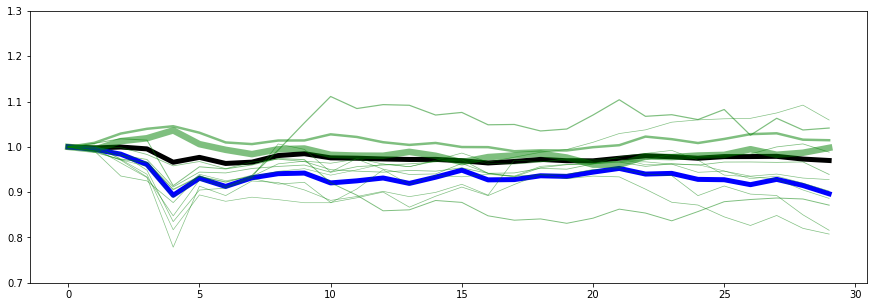

10.102625172368723


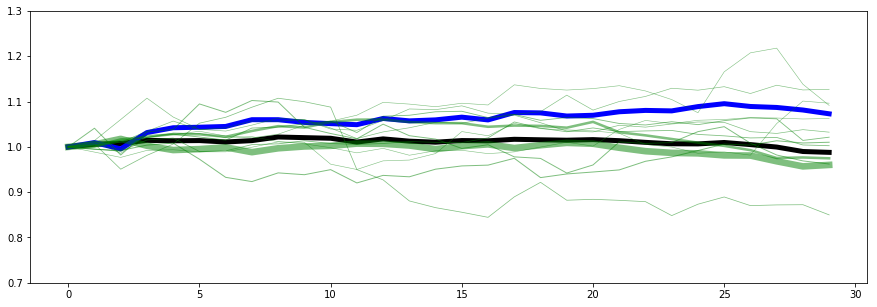

1.374708148873615


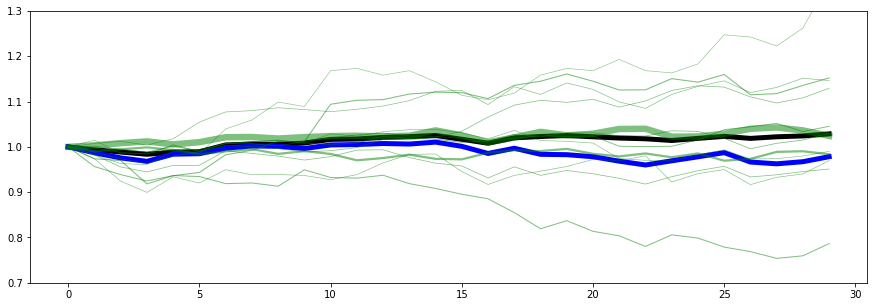

12.980349880488701


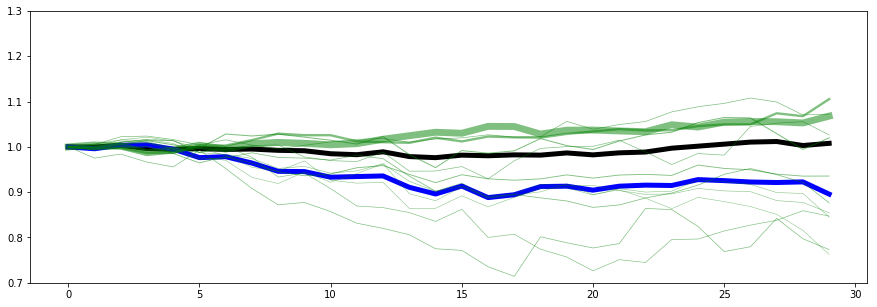

8.314066938678934


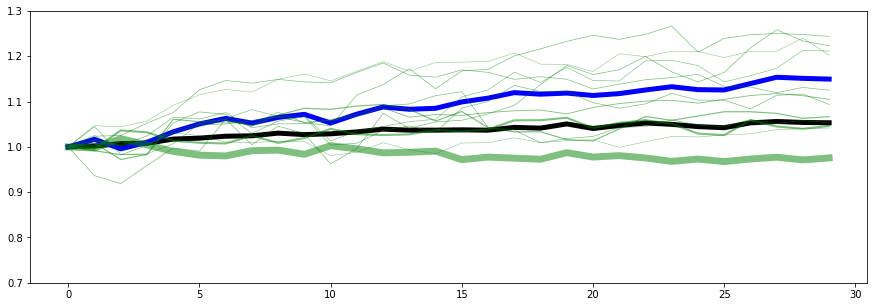

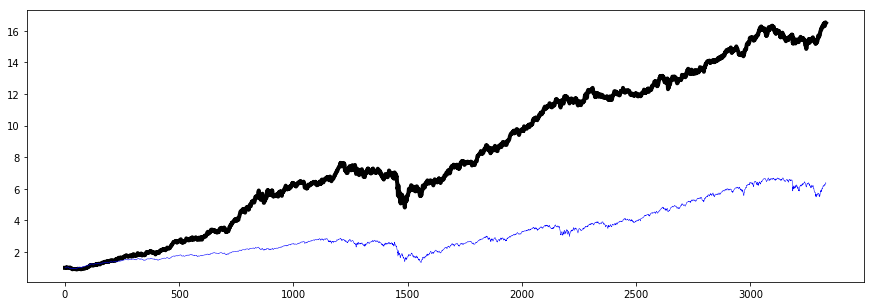

2.019637606508597


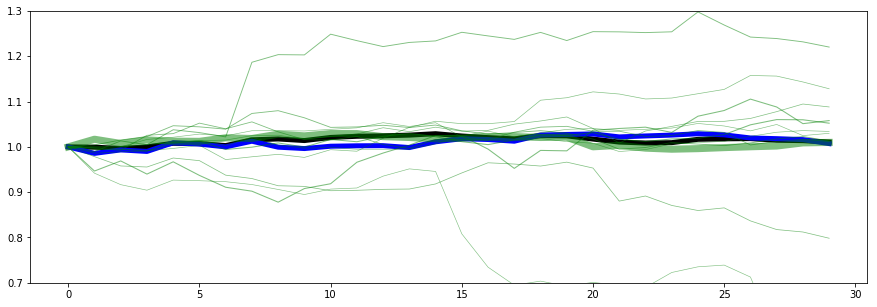

1.0892819302626258


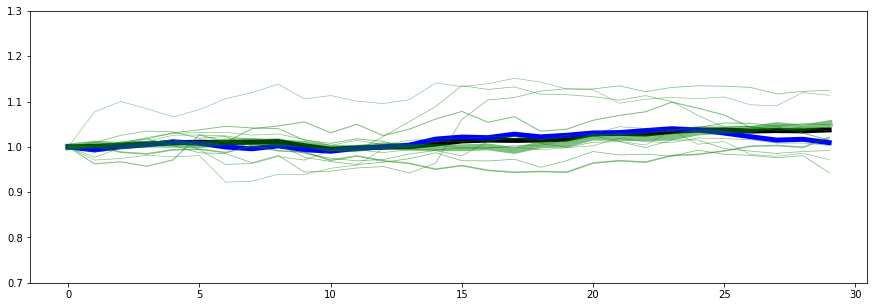

2.5263639628944734


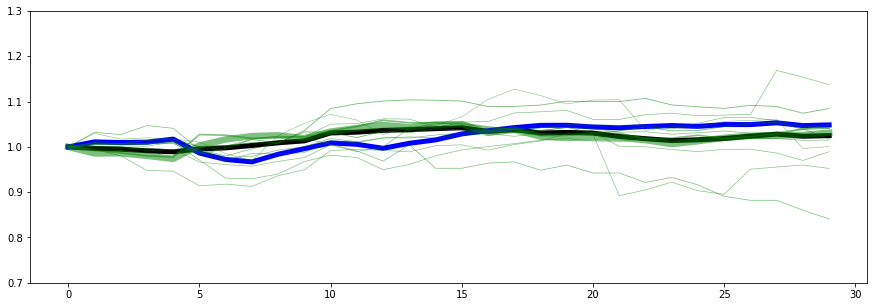

0.7516684297669226


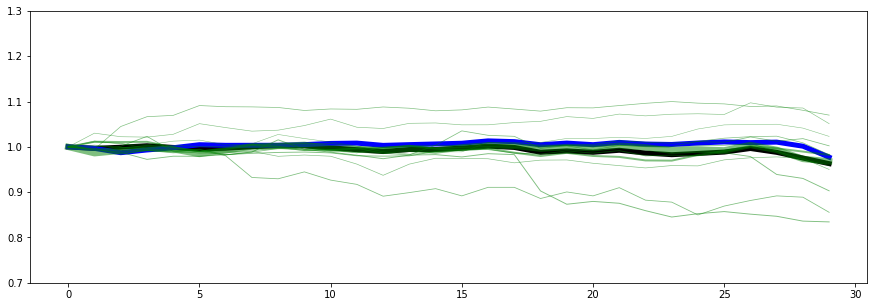

0.9098877601452036


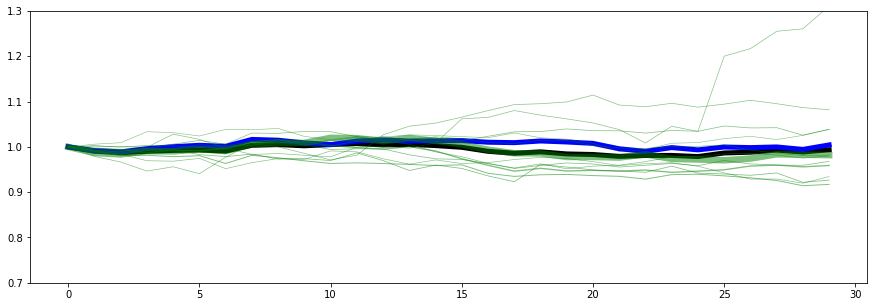

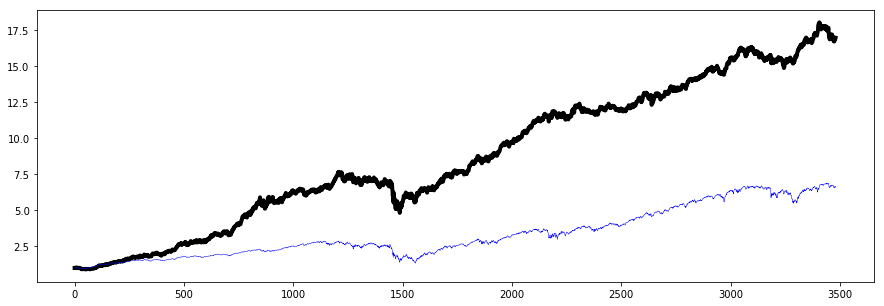

2.2371666059612143


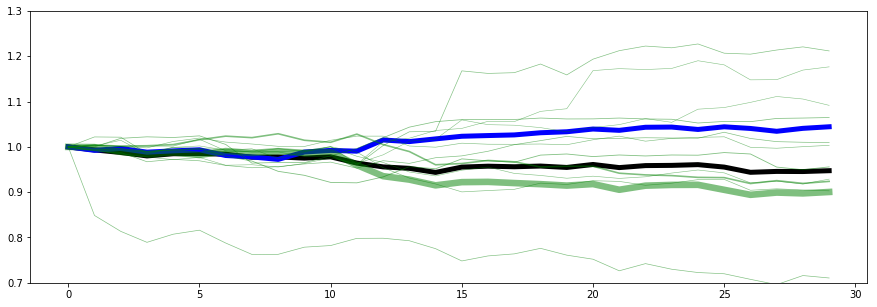

0.21049857560014856


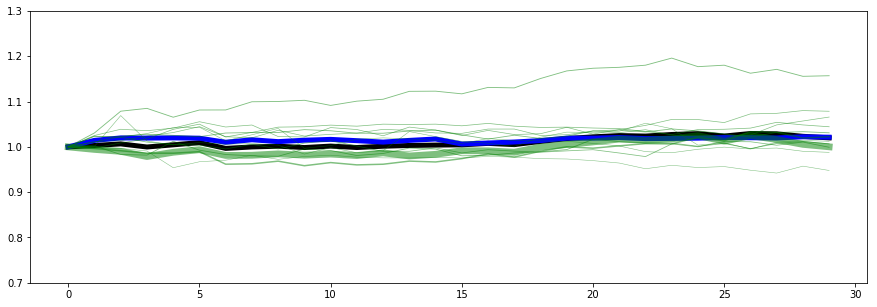

5.196678298860825


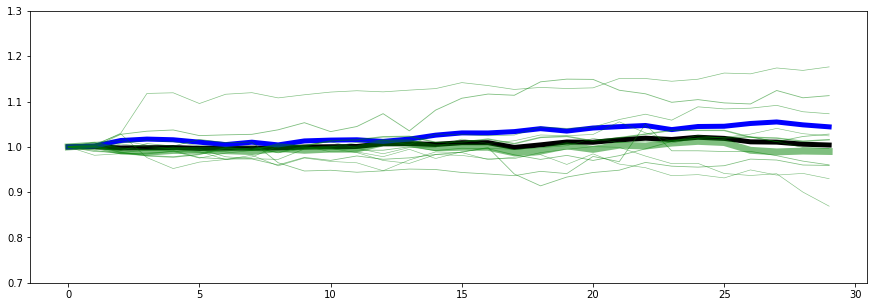

0.2972478707601204


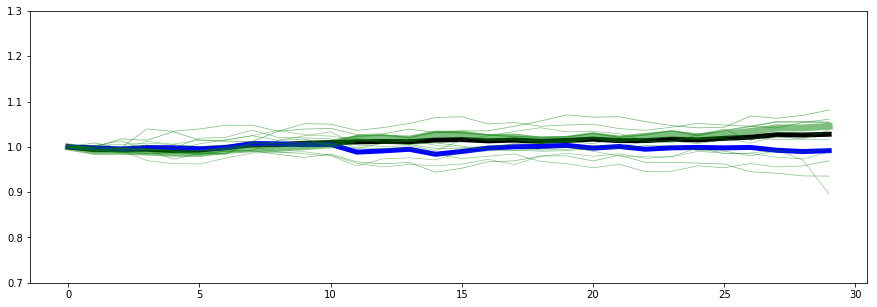

0.5181672636621475


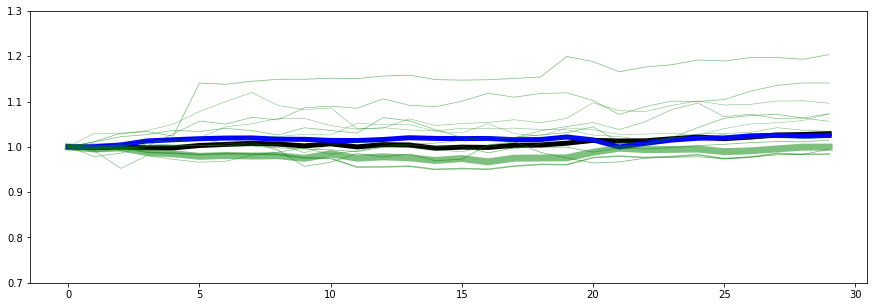

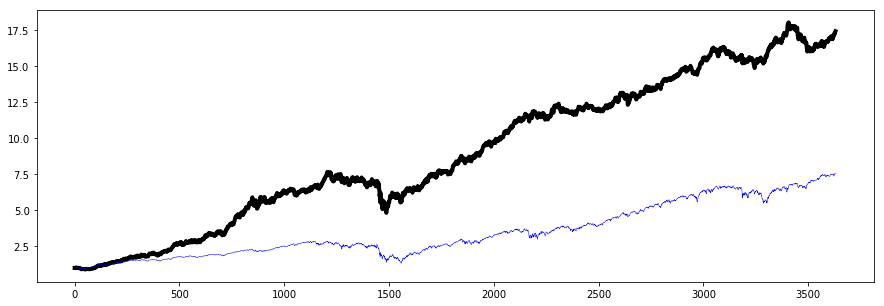

0.1469198358387715


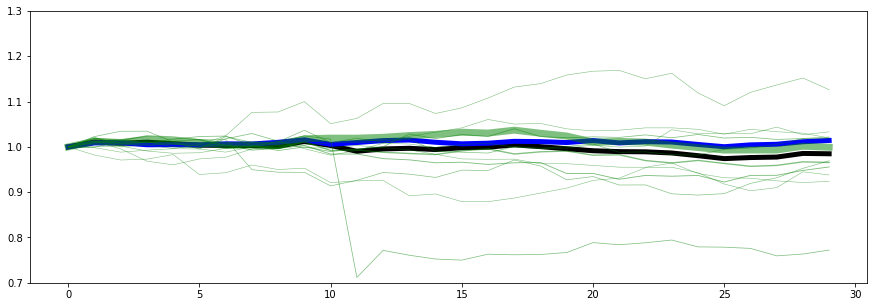

1.2345662790675824


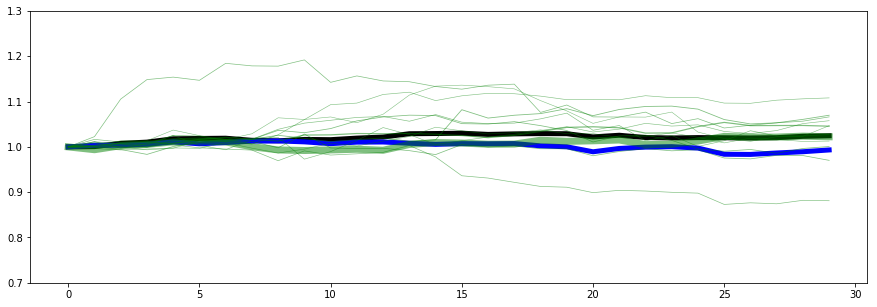

7.315818621117556


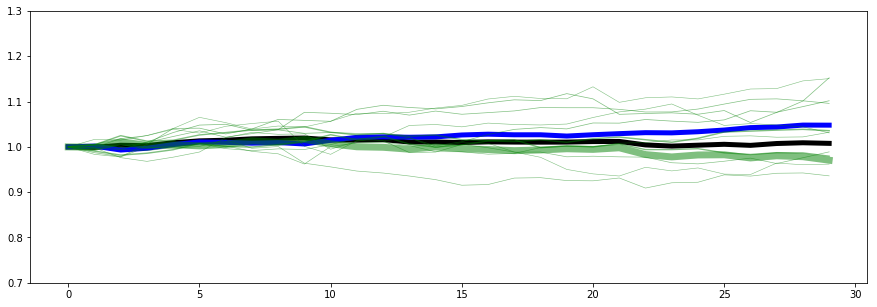

0.18289379093992778


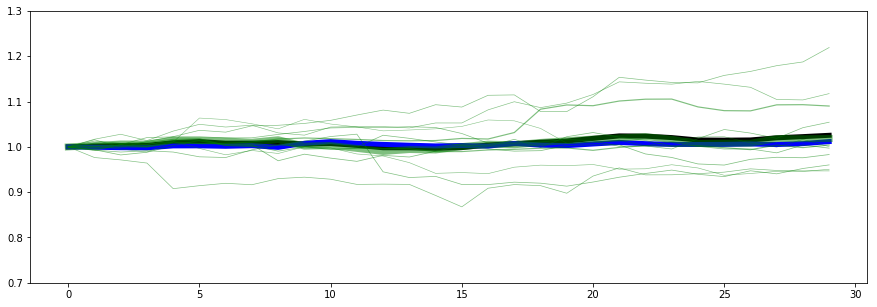

12.006173528407444


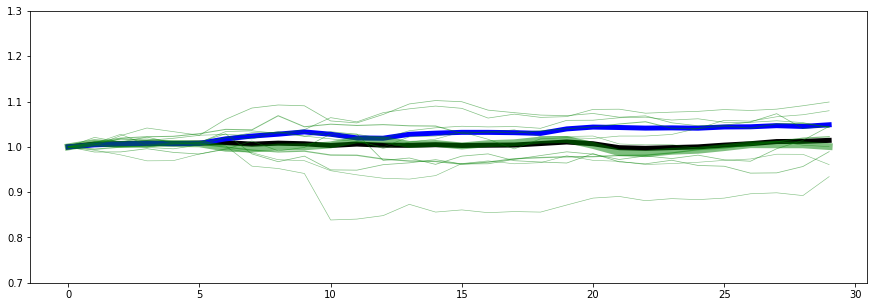

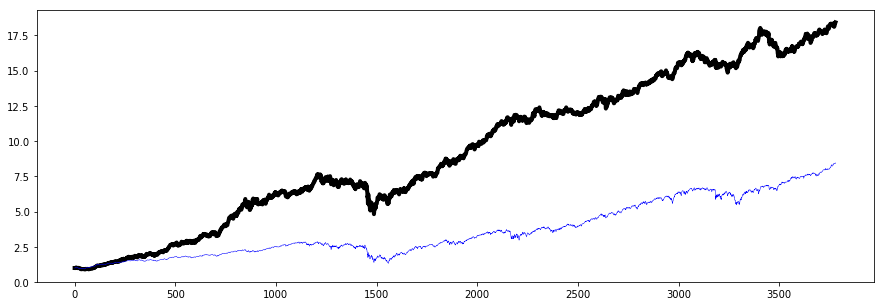

3.152923867111274


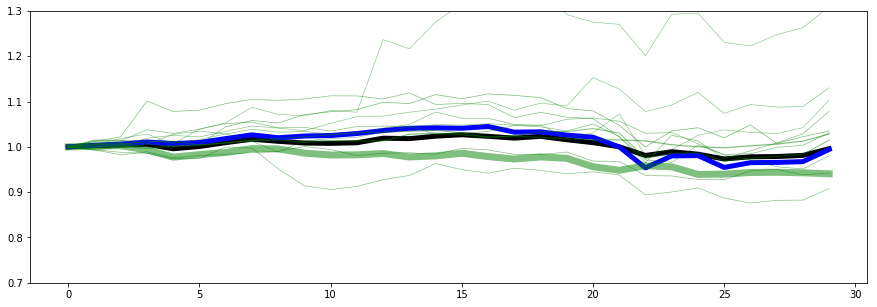

4.858416889815973


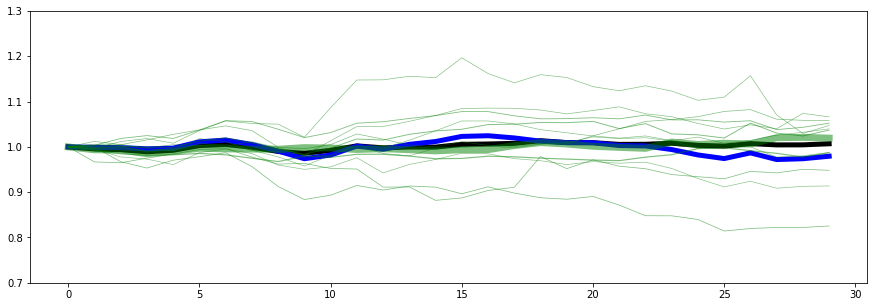

0.8795122992507736


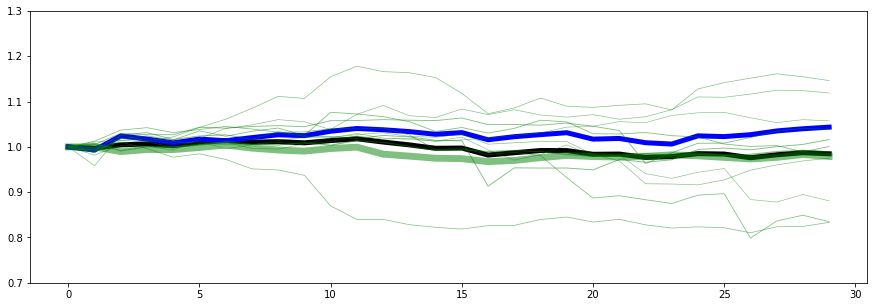

0.7599631038878564


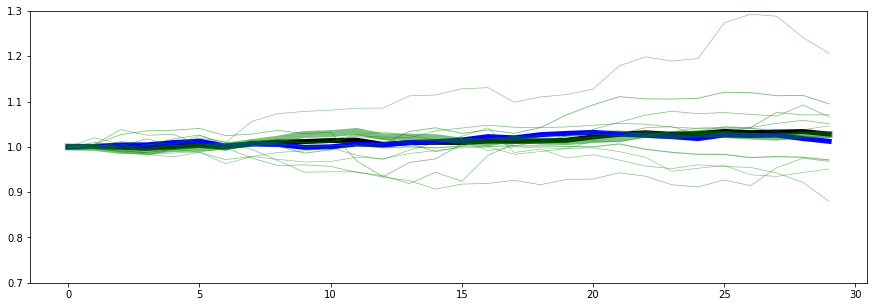

1.9639418360042822


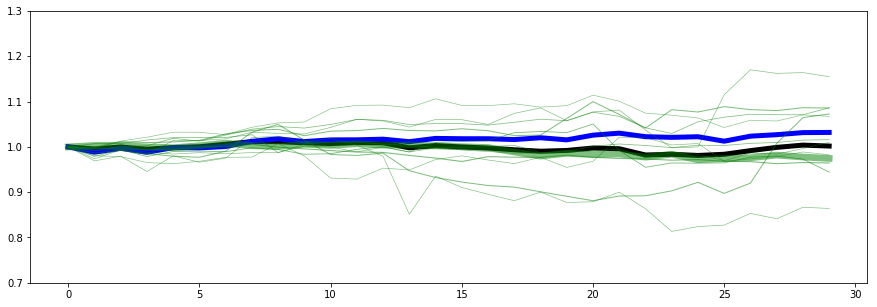

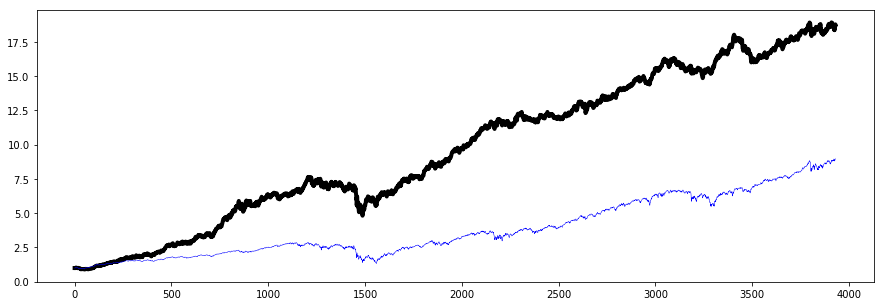

1.7296139356802989


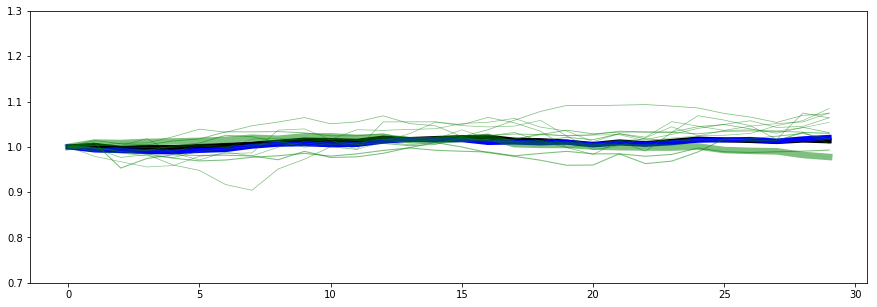

2.4350517403935013


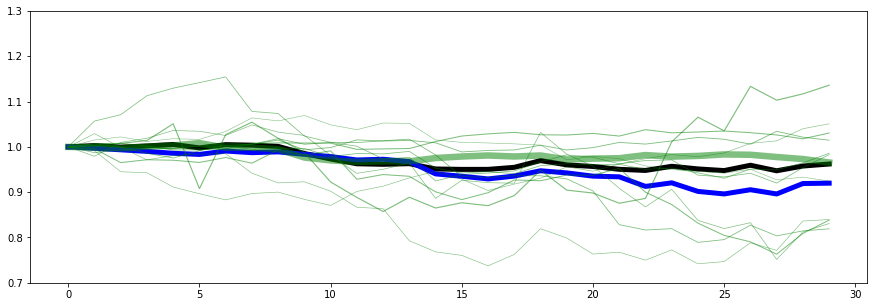

6.772956616133588


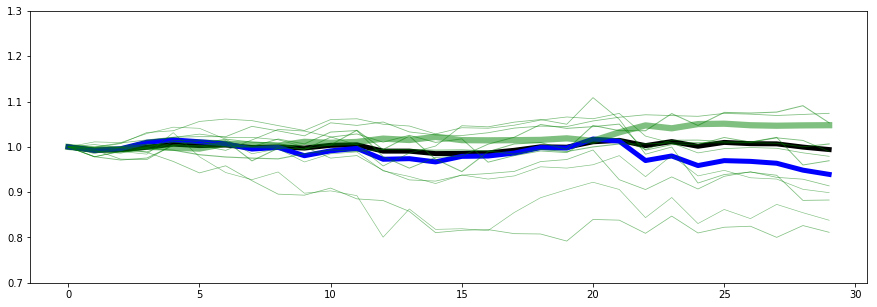

5.599352388644225


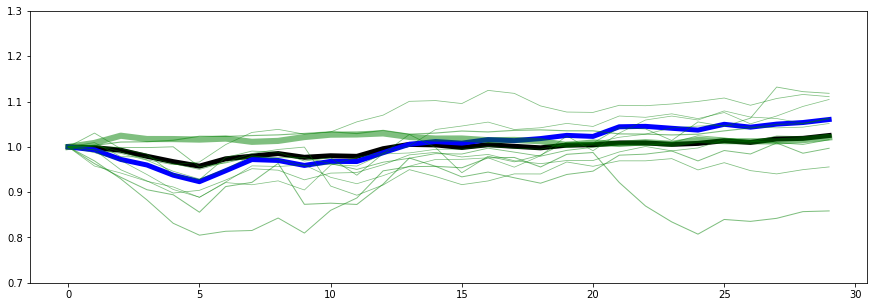

3.2486244606125485


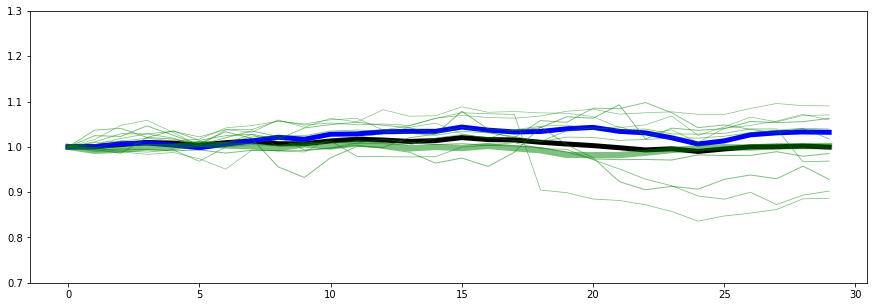

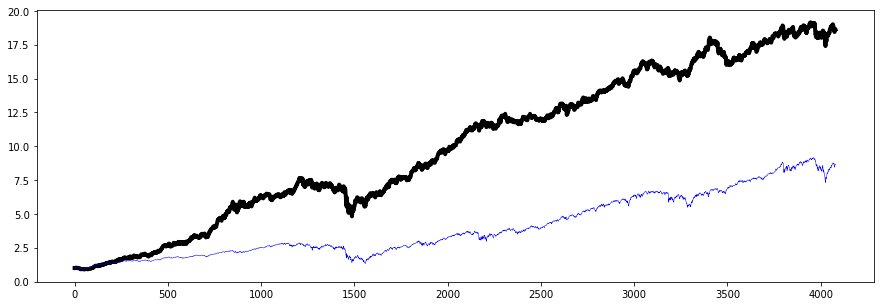

6.739169036154479


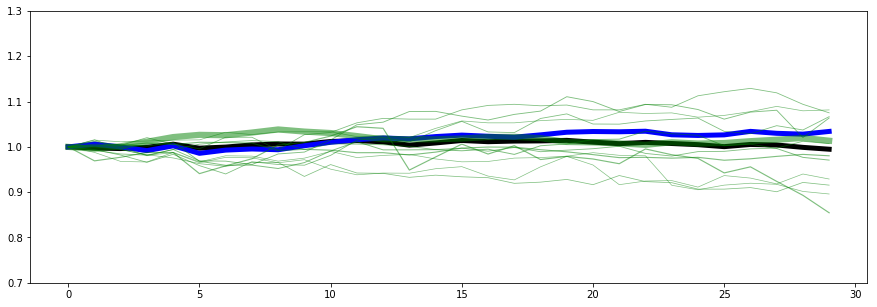

3.0540391740764536


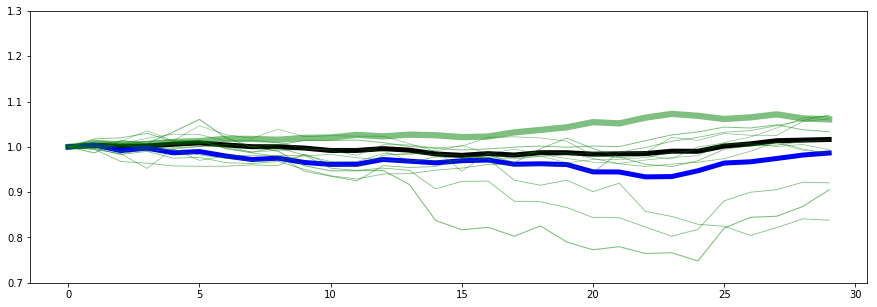

1.5126044662031173


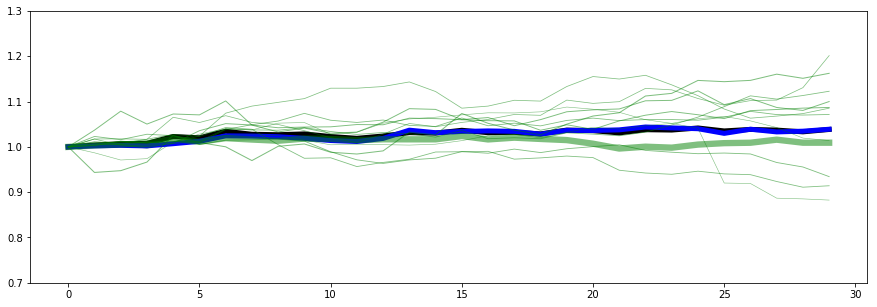

1.3903327708413422


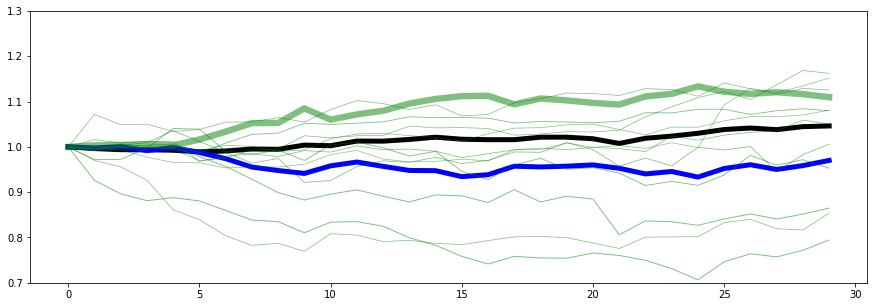

3.141807902420152


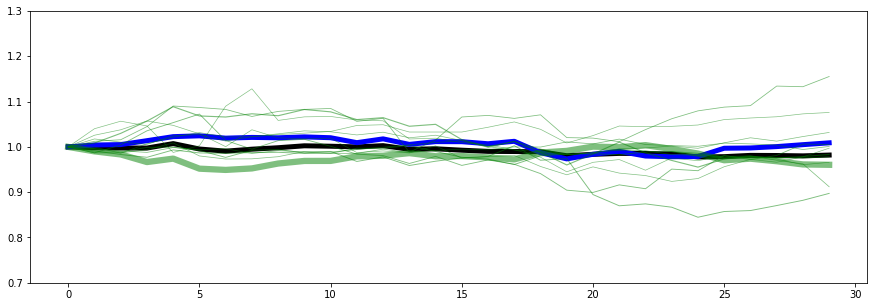

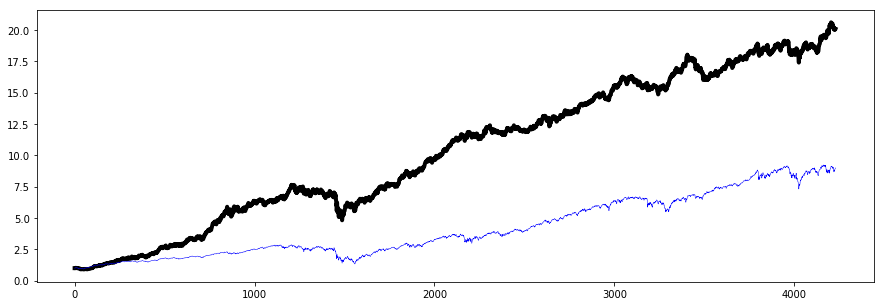

0.4323585194783483


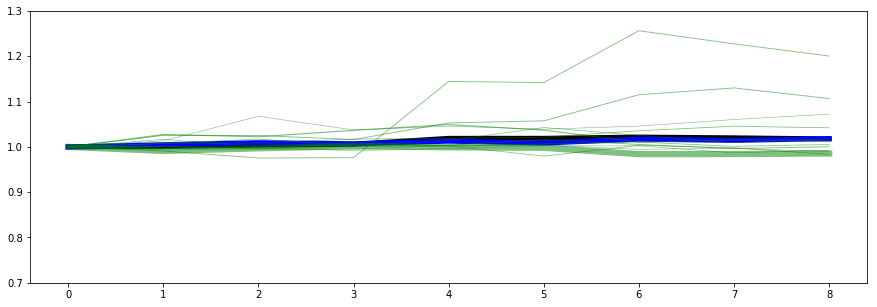

IndexError: single positional indexer is out-of-bounds

In [246]:
Mtotal = [1]
Ptotal = [1]

sdata =(pickle.load(open( "data2007_real.pickle", "rb" )))
for p in range(len(list(all_weights)[:])):
    
    # gathering data and removing any colomns with nan values
    pdata = sdata[period*p+data_length:period*(p+1)+data_length]
    pdata = pdata.dropna(axis='columns')
    
    # creating series of weights from previous step
    period_name = list(all_weights)[p] 
    wseries = all_weights[period_name].sort_values(ascending = False)[:12]
    
    #creating a dictionary of weights
    weight_dict = {}
    for ticker, weight in wseries.items():
        weight_dict[ticker] = weight
        
    
    
    # gathering list of tickers in wseries that are also in pdata
    Folio = [x for x,y in wseries.items() if y>0 and x in list(pdata)]
    
    
    # selecting tickers of Folio within Pdata, standardizing, and dropping null values
    FolioData = pdata[Folio].apply(lambda x: x/list(x)[0], axis=0).dropna(axis='columns')
    
    # summing up weights (should be 1, but some might be dropped because of data issues)
    FolioSum = sum([y for x,y in wseries.items() if x in list(FolioData)])
    
    # Multiplying each column in FolioData by the corresponding weight in wseries, and multiplying by previous portfolio value
    Wfolio = FolioData.dot([y*Ptotal[-1]/FolioSum for x,y in wseries.items() if y>0 and x in list(FolioData)])
    
    # Adding list to total simulation
    Ptotal+=list(Wfolio)
    ####
    
   
    for x in list(pdata): # removing columns without starting data
        if pdata.iloc[0][x] == 0 or pdata.iloc[0][x] == np.inf or pdata.iloc[0][x]==np.nan:
            pdata = pdata.drop(x,axis=1)
    dfm = pdata.apply(lambda x: x/list(x)[0], axis=0)
    
    market = [x*Mtotal[-1] for x in dfm.mean(axis=1)]
    #print((np.mean(Wfolio)/np.mean(market))*(np.var(market)/np.var(list(Wfolio))))
    Mtotal+=market
    
    if p%1 == 0:
        plt.figure(figsize=(15,5))
        plt.ylim(.7,1.3)
        pshow = [x/Wfolio[0] for x in list(Wfolio)]
        mshow = [x/market[0] for x in list(market)]
        print(np.var(mshow)/np.var(pshow))
        plt.plot(pshow, color='black',linewidth=5)
        plt.plot(mshow, color='blue',linewidth=5)
        for x in list(FolioData):
            plt.plot(list(FolioData[x]),label=x, linewidth=weight_dict[x]*25,c='green',alpha=.50)
        plt.show()
    if p%5 == 0:    
        plt.figure(figsize=(15,5))
        plt.plot(Ptotal,color='black',linewidth=4)
        plt.plot(Mtotal,color='blue',linewidth=.5)
        plt.show()
        
    

In [ ]:
testWs = all_weights.copy()
testWs['SUM'] = testWs.sum(axis=1)

In [ ]:
testWs = testWs.sort_values(by='SUM',ascending=False)

In [ ]:
testWs.head(20)

In [ ]:
sdata =(pickle.load(open( "data2007_real.pickle", "rb" )))
portfolio_value = [1]
pUP = []
cUP = []
compvalue = [1]
for p in range(len(list(all_weights))):
    try:
        pdata = sdata[period*p+data_length:period*(p+1)+data_length]        
        dfm = pdata.apply(lambda x: x/list(x)[0], axis=0)
        
        v1 = np.nan_to_num(list(all_weights[list(all_weights)[p]]))
        v2 = np.nan_to_num(list(dfm.iloc[-1])) 
        value = np.dot(v1,v2)

        
        
        portfolio_value.append(value*portfolio_value[-1])

        c1 = dfm.iloc[-1]
        c1[c1 == np.inf] = 0
        compvalue.append(compvalue[-1]*np.nanmean(c1))
        
        pUP.append(value)
        cUP.append(np.nanmean(c1))
        
    except:
        pass

In [ ]:
plt.plot(portfolio_value)
plt.plot(compvalue)

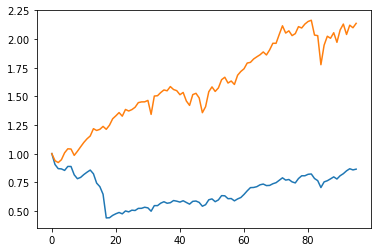

In [89]:
start = 150

plt.plot([x/portfolio_value[start] for x in portfolio_value[start:]])
plt.plot([x/compvalue[start] for x in compvalue[start:]])

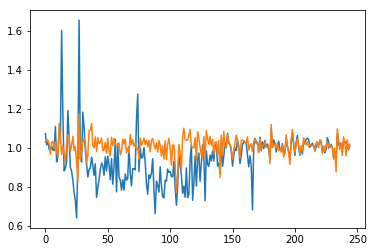

In [90]:
plt.plot(pUP)
plt.plot(cUP)

In [76]:
pdata = pickle.load(open( "data2007_real.pickle", "rb" ))[3000:]
dfm = pdata.apply(lambda x: x/list(x)[0], axis=0)


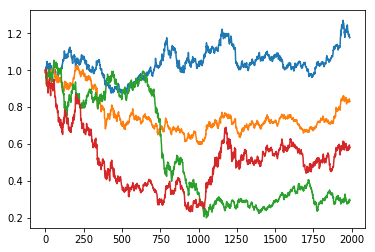

In [80]:
plt.plot(list(dfm['TLT']))
plt.plot(list(dfm['GLD']))
plt.plot(list(dfm['USO']))
plt.plot(list(dfm['NEM']))